# Bank of England Sentiment Analysis
## Employer Project
### Team 8 AnalytIQ, June 2nd, 2025
**Team Members**: Lalitha Vemuri, Christina Tsoulfa, Reka Bodo, Yann Hirsig, Louis Pang, Dr. Karin Agius Ferrante

## Content
1. Approach
2. Load the Data
4. Exploratory Sentiment Analysis & Natural Language Processing (NLP)
5. Exploratory Analysis for Correlation with Economic Indicators
8. Insights & Recommendations

## 1. Approach

The **Bank of England (BoE)**, the UK’s central bank and one of the world’s leading financial institutions, plays a pivotal role in maintaining economic and financial stability, and supporting the UK government’s economic policies. One of its key communication channels with the public and markets is through formal speeches delivered by its representatives. These speeches aim to offer guidance, manage expectations, and provide clarity in times of uncertainty.

However, the effectiveness and impact of these speeches on economic indicators and market behaviour are not fully understood. 

This project seeks to explore whether the sentiment and timing of BoE speeches hold analytical or predictive value, when compared with economic performance and key events.

### Main Business Questions
**Has the tone or sentiment of the BoE’s speeches evolved over time? If so, how?**<br>
**How do sentiments align with events like interest rate changes, policy reports, or major economic releases?**

**Sub-questions**

1.	Are there measurable correlations between speech sentiment and UK economic indicators such as inflation, GDP, employment rates and bond yields?
2. Does the change in sentiment change economic indicators or is the speech sentiment reactive to economic indicators?
3. Can speech sentiment trends be used to predict market reactions or economic outcomes?
4. What broader insights can be drawn to support data-informed communication strategies?

## 2. Load the Data

### 2.1. Import libraries

In [ ]:
# Install the necessary libraries.
# !pip install nltk
# !pip install vaderSentiment
# !pip install textblob
# !pip install pandas openpyxl
# !pip install transformers torch

In [ ]:
# import nltk
# nltk.download('punkt')
# nltk.download('stopwords')
# nltk.download('words')
# nltk.download('omw-1.4')

In [273]:
# General libraries
import numpy as np                             # Numerical operations and array handling.
import pandas as pd                            # Data manipulation and analysis.
import contractions                            # Expanding/contracting text contractions.
import re                                      # Regular expression operations on strings.
import os                                      # Interacting with the operating system and file handling.
import matplotlib.pyplot as plt                # Create visualisations.
from matplotlib.colors import rgb2hex          # Colour conversion in plots.
import seaborn as sns                          # Enhanced statistical data visualisations.
import math                                    # Mathematical functions and constants.
from IPython.display import display, Markdown  # Rich output in Jupyter.
from functools import reduce
from sklearn.feature_extraction.text import CountVectorizer
from collections import  Counter
import plotly.express as px

In [2]:
# Text and Sentiment Analysis 
from wordcloud import WordCloud                                       # Generating visual word frequency clouds from text.
import nltk                                                           # Natural language processing tasks.
from nltk import word_tokenize, pos_tag                               # Splitting text into words and tags with part of speech
from nltk import defaultdict                                          # Providing default values for nonexistent keys.
from nltk.probability import FreqDist                                 # Calculating frequency distribution of tokens.
from nltk.corpus import stopwords                                     # Providing list of common words to exclude from analysis.
from nltk.corpus import words
from nltk.corpus import wordnet as wn                                 # Lexical database for retrieving word relationships & meanings.
from nltk.stem import WordNetLemmatizer, PorterStemmer                # Reducing words to base or root form.
from nltk.probability import FreqDist
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer  # Assessing sentiment intensity in text.
from textblob import TextBlob                                         # API for text processing tasks including sentiment analysis.
import contractions                                                   # Expanding/contracting text contractions.
import re                                                             # Regular expression operations on strings.
import ast                                                            # If column contains string representations of lists
from collections import defaultdict  # Creating dictionaries that return default value for nonexistent keys.
from collections import Counter  # Importing Counter for counting hashable objects and efficiently tallying occurrences in an iterable.
from transformers import AutoTokenizer                                # FinBERT Model
from transformers import AutoModelForSequenceClassification           # FinBERT Model
import torch                                                          # FinBERT Model
import torch.nn.functional as F                                       # FinBERT Model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
stop_words = set(stopwords.words('english'))

In [4]:
# FinBERT Models: Load model 1: ProsusAI/finbert
tokenizer_prosus = AutoTokenizer.from_pretrained('ProsusAI/finbert')
model_prosus = AutoModelForSequenceClassification.from_pretrained('ProsusAI/finbert').to(device)

In [5]:
# FinBERT Models: Load model 2: yiyanghkust/finbert-tone
tokenizer_yiyang = AutoTokenizer.from_pretrained('yiyanghkust/finbert-tone')
model_yiyang = AutoModelForSequenceClassification.from_pretrained('yiyanghkust/finbert-tone').to(device)

In [6]:
# Import warnings
import warnings
# Settings for the notebook.
warnings.filterwarnings("ignore")

In [8]:
# Set figure style for seaborn.
sns.set_theme(style='darkgrid')

### 2.2. Define functions

**2.2.a. Charts**

In [ ]:
def clean_label(label):
    # If label is a Series, return its name.
    if isinstance(label, pd.Series):
        return label.name.replace('_', ' ').title() if label.name else ' '
    elif isinstance(label, str):
        return label.replace('_', ' ').title()
    return ' '

In [ ]:
# Define function for scatterplot.
def generate_scatterplot(df, x_axis, y_axis, title, hue, save_path=None):

    # Set figure size & style for seaborn.
    sns.set_theme(style='darkgrid')
    sns.set(rc={'figure.figsize':(8, 6)})

    # Plot the scatterplot.
    sns.scatterplot(data=df, x=x_axis, y=y_axis, hue=hue, color='#0e1b2c')

    # Customize the plot.
    plt.title(title, fontsize=12, fontweight='bold')
    plt.xlabel(clean_label(x_axis), fontsize=10)
    plt.ylabel(clean_label(y_axis), fontsize=10)

    # Add legend ONLY if hue is not None.
    if hue is not None:
        plt.legend(title='Legend', fontsize=10, bbox_to_anchor=(1.05,1), loc='upper left')
    
    # Save the plot, if save_path is provided.
    if save_path:
        plt.savefig(save_path, dpi=500, bbox_inches='tight')

    # Display the chart.
    plt.tight_layout()
    plt.show()

In [ ]:
# Define function to plot a lineplot.
def generate_lineplot(df, x_axis, y_axis, title, ylim=None, save_path=None, \
                      rotate_xticks=False):
    
    # Set figure size & style for seaborn.
    sns.set_theme(style='darkgrid')
    sns.set(rc={'figure.figsize':(14, 8)})
    
    # Ensure time column is in datetime format.
    df[x_axis] = pd.to_datetime(df[x_axis])
    
    # Sort DataFrame by the time column.
    df.sort_values(by=x_axis, inplace=True)
    
    # Plot the lineplot.
    sns.lineplot(data=df, x=x_axis, y=y_axis, label=clean_label(y_axis))
    
    # Customize the plot.
    plt.title(title, fontsize=16, fontweight='bold')
    plt.xlabel(clean_label(x_axis), fontsize=14)
    plt.ylabel(clean_label(y_axis), fontsize=14)
    plt.legend(title='Legend', fontsize=12, bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tick_params(axis='both', labelsize=12)
    
    # Rotate x-tick labels by 45 degrees, if specified.
    if rotate_xticks:
        plt.xticks(rotation=45)
    
    # Set y-axis limits, if provided.
    if ylim:
        plt.ylim(ylim)

    # Save the plot, if save_path is provided.
    if save_path:
        plt.savefig(save_path, dpi=500, bbox_inches='tight')
    
    # Display the chart.
    plt.tight_layout()
    plt.show()

**2.2.b. NLP analysis**

In [13]:
# Preprocessing function
def preprocess_text(text):
    text = contractions.fix(text)  # Expand contractions i.e I'm not good goes to I am not good
    text = re.sub(r'http\S+', '', text)  # Remove URLs
    text = re.sub('#', '', text)         # Remove hashtags
    text = re.sub(r'\W', ' ', text)      # Remove special characters
    text = text.lower()                  # Convert to lowercase
    #Below is to create a set of stop words from the NLTK library's predefined list but not is excluded.
    stop_words = set(stopwords.words('english')) - {'not'} 
    text = ' '.join([word for word in text.split() if word not in stop_words])
    return text

In [15]:
# Define the tag map for POS tagging.
tag_map = defaultdict(lambda: wn.NOUN)
tag_map['J'] = wn.ADJ
tag_map['V'] = wn.VERB
tag_map['R'] = wn.ADV

# Lemmatise the tokens with correct POS tags.
lemma_function = WordNetLemmatizer()

# Lemmatisation function.
def lemmatize_tokens(tokens):
    #For each word in the token list, it lemmatizes the word with the correct part-of-speech
    lemmatized_tokens = [lemma_function.lemmatize(token, tag_map[tag[0]]) for token, tag in pos_tag(tokens)]
    return lemmatized_tokens

In [16]:
# VADER Sentiment Intensity Analyzer.
analyzer = SentimentIntensityAnalyzer()

# Define the function to compute and return sentiment scores.
def analyse_sentiment(text):
    return analyzer.polarity_scores(' '.join(text))

In [19]:
# Define function to label sentiments.
def get_sentiment_label(compound):
    if compound >= 0.05:
        return 'positive'
    elif compound <= -0.05:
        return 'negative'
    else:
        return 'neutral'

In [21]:
# Define a function to extract a polarity score using TextBlob.
def generate_polarity(comment):
    return TextBlob(comment).sentiment[0]

In [23]:
# Define a function to extract a subjectivity score using TextBlob.
def generate_subjectivity(comment):
    return TextBlob(comment).sentiment[1]

### 2.3. Import and review the data

**2.3.a. Import Bank of England Speeches**

In [25]:
# Load the CSV file as speeches.
speeches = pd.read_csv('/Users/kaferrante/Documents/Python/_Course4_Project/all_speeches.csv')

# View the data.
speeches.head()

,reference,country,date,title,author,is_gov,text
0,r901128a_BOA,australia,1990-11-28,A Proper Role for Monetary Policy,fraser,0,They would no doubt argue that to have two obj...
1,r911003a_BOA,australia,1991-10-03,,fraser,0,Today I wish to talk about real interest rates...
2,r920314a_BOA,australia,1992-03-14,,fraser,0,I welcome this opportunity to talk about prosp...
3,r920529a_BOA,australia,1992-05-29,,fraser,0,It is a pleasure to have this opportunity to a...
4,r920817a_BOA,australia,1992-08-17,,fraser,0,"As a long-time fan of Don Sanders, I am deligh..."


In [27]:
# Explore data set.
speeches.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7721 entries, 0 to 7720
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   reference  7721 non-null   object
 1   country    7721 non-null   object
 2   date       7721 non-null   object
 3   title      7721 non-null   object
 4   author     7721 non-null   object
 5   is_gov     7721 non-null   int64 
 6   text       7721 non-null   object
dtypes: int64(1), object(6)
memory usage: 422.4+ KB


In [29]:
# Check for missing values.
speeches.isnull().sum()

reference    0
country      0
date         0
title        0
author       0
is_gov       0
text         0
dtype: int64

In [31]:
# Check for duplicates.
speeches.duplicated().sum()

0

In [33]:
# Review basic descriptive statistics.
speeches.describe()

,is_gov
count,7721.000000
mean,0.347235
std,0.476122
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [35]:
# Check the number of unique values.
speeches.nunique()

reference    7721
country         8
date         4410
title        6218
author        325
is_gov          2
text         7692
dtype: int64

In [37]:
# View the countries.
speeches['country'].unique()

array(['australia', 'canada', 'euro area', 'japan', 'sweden',
       'switzerland', 'united kingdom', 'united states'], dtype=object)

In [39]:
# View the author.
speeches['author'].unique()

array(['fraser', 'macfarlane', 'lowe', 'stevens', 'no_info', 'ac',
       'thiessen', 'bonin', 'dodge', 'jenkins', 'kennedy', 'macklem',
       'duguay', 'longworth', 'carney', 'murray', 'lane', 'wolf',
       'boivin', 'cote', 'poloz', 'schembri', 'johnson', 'wilkins',
       'chilcott', 'mendes', 'patterson', 'murchison', 'leduc', 'dinis',
       'beaudry', 'gravelle', 'kozicki', 'rogers', 'morrow', 'lamfalussy',
       'duisenberg', 'vienna', 'london', 'tokyo', 'kong', 'bank',
       'schioppa', 'hamalainen', 'main', 'noyer', 'committee', 'solans',
       'francisco', 'istanbul', 'issing', 'hoogduin', 'bankwashington',
       'efma', 'brussels', 'forum', 'workshop', 'quiros', 'papademos',
       'gugerell', 'trichet', 'network', 'delivered', 'paramo',
       'strasbourg', 'rome', 'berlin', 'smaghi', 'sevilla', 'madrid',
       'stark', 'singapore', 'summit', 'washington', 'aires',
       'bratislava', 'ecb', 'constancio', 'posen', 'praet', 'draghi',
       'coeure', 'asmussen', 'mer

**2.3.b. Import Sentiment Label Lexicon**

**BoE Word List**

In [41]:
# Load the Excel file of BoE sentiment labelled wordlist.
sentiment_lexicon = pd.read_excel('/Users/kaferrante/Documents/Python/_Course4_Project/sentiment_labelled_wordlist.xlsx')

# View the data.
sentiment_lexicon.head()

,Word,Negative,Positive,Uncertainty,Litigious,Strong,Weak,Constraining
0,ABANDON,1,0,0,0,0,0,0
1,ABANDONED,1,0,0,0,0,0,0
2,ABANDONING,1,0,0,0,0,0,0
3,ABANDONMENT,1,0,0,0,0,0,0
4,ABANDONMENTS,1,0,0,0,0,0,0


In [43]:
# Explore data set.
sentiment_lexicon.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3880 entries, 0 to 3879
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Word          3880 non-null   object
 1   Negative      3880 non-null   int64 
 2   Positive      3880 non-null   int64 
 3   Uncertainty   3880 non-null   int64 
 4   Litigious     3880 non-null   int64 
 5   Strong        3880 non-null   int64 
 6   Weak          3880 non-null   int64 
 7   Constraining  3880 non-null   int64 
dtypes: int64(7), object(1)
memory usage: 242.6+ KB


In [45]:
# Check for missing values.
sentiment_lexicon.isnull().sum()

Word            0
Negative        0
Positive        0
Uncertainty     0
Litigious       0
Strong          0
Weak            0
Constraining    0
dtype: int64

In [47]:
# Review basic descriptive statistics.
sentiment_lexicon.describe()

,Negative,Positive,Uncertainty,Litigious,Strong,Weak,Constraining
count,3880.000000,3880.000000,3880.000000,3880.000000,3880.000000,3880.000000,3880.000000
mean,0.606959,0.092268,0.076546,0.233247,0.004897,0.006959,0.047423
std,0.488489,0.289441,0.265905,0.422953,0.069815,0.083139,0.212569
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


**Custom Dictionary**

In [49]:
# Load the CSV file custom_dictionary.
custom_dict = pd.read_csv('/Users/kaferrante/Documents/Python/_Course4_Project/custom_dictionary.csv')

# View the data.
custom_dict.head()

,Word,positive_custom,negative_custom,uncertainty_custom
0,expansion,1,0,0
1,recovery,1,0,0
2,robust,1,0,0
3,resilience,1,0,0
4,strengthening,1,0,0


In [51]:
# Explore data set.
custom_dict.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35 entries, 0 to 34
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Word                35 non-null     object
 1   positive_custom     35 non-null     int64 
 2   negative_custom     35 non-null     int64 
 3   uncertainty_custom  35 non-null     int64 
dtypes: int64(3), object(1)
memory usage: 1.2+ KB


In [53]:
# Check for missing values.
custom_dict.isnull().sum()

Word                  0
positive_custom       0
negative_custom       0
uncertainty_custom    0
dtype: int64

In [55]:
# Review basic descriptive statistics.
custom_dict.describe()

,positive_custom,negative_custom,uncertainty_custom
count,35.000000,35.000000,35.000000
mean,0.314286,0.428571,0.257143
std,0.471008,0.502096,0.443440
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000
75%,1.000000,1.000000,0.500000
max,1.000000,1.000000,1.000000


In [57]:
# Check the number of unique values.
custom_dict.nunique()

Word                  35
positive_custom        2
negative_custom        2
uncertainty_custom     2
dtype: int64

**GPT Sentiment**

In [59]:
# Load the CSV file as speeches.
gpt_sentiment = pd.read_excel('/Users/kaferrante/Documents/Python/_Course4_Project/boe_sentiment_results.xlsx')

# View the data.
gpt_sentiment.head()

,Reference,Title,Gpt_sentiment
0,r980915a_BOE,Speech,Positive
1,r981021b_BOE,Britain in Europe,Positive
2,r981021a_BOE,Impact of the recent turbulence in internation...,Neutral
3,r981101a_BOE,"Economic policy, with and without forecasts",Neutral
4,r981101b_BOE,Inflation targeting in practice: the UK experi...,Positive


In [61]:
# Rename the confidence index column.
gpt_sentiment.rename(columns={'Reference': 'reference'}, inplace=True)

# View the DataFrame.
gpt_sentiment.head()

,reference,Title,Gpt_sentiment
0,r980915a_BOE,Speech,Positive
1,r981021b_BOE,Britain in Europe,Positive
2,r981021a_BOE,Impact of the recent turbulence in internation...,Neutral
3,r981101a_BOE,"Economic policy, with and without forecasts",Neutral
4,r981101b_BOE,Inflation targeting in practice: the UK experi...,Positive


In [63]:
# View the countries.
gpt_sentiment['Gpt_sentiment'].unique()

array(['Positive', 'Neutral', 'Negative'], dtype=object)

**2.3.c. Import UK Economic Indicators (1998-2025)**

In [538]:
# Load the Excel file for UK Economic Indicators
uk_economic_indicators = pd.read_excel('/Users/kaferrante/Documents/Python/_Course4_Project/Consolidated_Eco_KPI _V3.xlsx')

# View the data.
uk_economic_indicators.head()

,year,month,year_month,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
0,1998,4,1998-04,1.815,6.3,0.6,7.25,1.1,1.673270,5554.720972,5.91,5.70,5.71,14.1,24.7,64258
1,1998,5,1998-05,2.039,6.3,0.6,7.25,1.2,1.636589,5799.256322,5.82,5.57,5.55,14.4,24.5,64258
2,1998,6,1998-06,1.675,6.3,0.6,7.50,-1.3,1.650718,5739.277233,6.17,5.64,5.43,13.9,25.5,64258
3,1998,7,1998-07,1.443,6.3,0.3,7.50,-4.3,1.643657,5595.919582,6.06,5.57,5.38,14.6,25.6,67057
4,1998,8,1998-08,1.327,6.2,0.3,7.50,-6.5,1.631950,5173.355054,5.52,5.19,5.11,14.6,26.1,67057


In [540]:
# Explore data set.
uk_economic_indicators.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 321 entries, 0 to 320
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   year                          321 non-null    int64  
 1   month                         321 non-null    int64  
 2   year_month                    321 non-null    object 
 3   uk_inflation_rate_CPIH        321 non-null    float64
 4   uk_unemployment_rate          321 non-null    float64
 5   uk_gdp_growth                 321 non-null    float64
 6   uk_interest_rate              321 non-null    float64
 7   uk_consumer_confidence        321 non-null    float64
 8   gbp_usd_fx                    321 non-null    float64
 9   ftse_250                      321 non-null    float64
 10  gilts_short                   321 non-null    float64
 11  gilts_medium                  321 non-null    float64
 12  gilts_long                    321 non-null    float64
 13  uk_cr

In [542]:
# Check for missing values.
uk_economic_indicators.isnull().sum()

year                            0
month                           0
year_month                      0
uk_inflation_rate_CPIH          0
uk_unemployment_rate            0
uk_gdp_growth                   0
uk_interest_rate                0
uk_consumer_confidence          0
gbp_usd_fx                      0
ftse_250                        0
gilts_short                     0
gilts_medium                    0
gilts_long                      0
uk_credit_growth_no_cc          0
uk_credit_growth_only_cc        0
avg_price_all_property_types    0
dtype: int64

In [544]:
# View column types.
uk_economic_indicators.dtypes

year                              int64
month                             int64
year_month                       object
uk_inflation_rate_CPIH          float64
uk_unemployment_rate            float64
uk_gdp_growth                   float64
uk_interest_rate                float64
uk_consumer_confidence          float64
gbp_usd_fx                      float64
ftse_250                        float64
gilts_short                     float64
gilts_medium                    float64
gilts_long                      float64
uk_credit_growth_no_cc          float64
uk_credit_growth_only_cc        float64
avg_price_all_property_types      int64
dtype: object

### 2.4. Date Transformation

**Speeches**

In [73]:
# Determine the date format for speeches.
speeches.date.head()

0    1990-11-28
1    1991-10-03
2    1992-03-14
3    1992-05-29
4    1992-08-17
Name: date, dtype: object

In [75]:
# Change date format from 'object' to 'datetime64' and display in a new column
speeches['date_format'] = speeches['date'].astype('datetime64[ns]')

In [77]:
# Add a new column for year and month
speeches['year_month'] = pd.to_datetime(speeches['date_format']).dt.to_period('M')

In [79]:
# Add a new column for year only
speeches['year'] = pd.to_datetime(speeches.date).dt.year

In [81]:
# Add a column for year_month in date format
speeches['year_month_dt'] = speeches['year_month'].dt.to_timestamp()

In [83]:
# View the DataFrame.
speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,year_month_dt
0,r901128a_BOA,australia,1990-11-28,A Proper Role for Monetary Policy,fraser,0,They would no doubt argue that to have two obj...,1990-11-28,1990-11,1990,1990-11-01
1,r911003a_BOA,australia,1991-10-03,,fraser,0,Today I wish to talk about real interest rates...,1991-10-03,1991-10,1991,1991-10-01
2,r920314a_BOA,australia,1992-03-14,,fraser,0,I welcome this opportunity to talk about prosp...,1992-03-14,1992-03,1992,1992-03-01
3,r920529a_BOA,australia,1992-05-29,,fraser,0,It is a pleasure to have this opportunity to a...,1992-05-29,1992-05,1992,1992-05-01
4,r920817a_BOA,australia,1992-08-17,,fraser,0,"As a long-time fan of Don Sanders, I am deligh...",1992-08-17,1992-08,1992,1992-08-01


In [85]:
# View column types.
speeches.dtypes

reference                object
country                  object
date                     object
title                    object
author                   object
is_gov                    int64
text                     object
date_format      datetime64[ns]
year_month            period[M]
year                      int32
year_month_dt    datetime64[ns]
dtype: object

**Indicators**

In [548]:
# Add a new column for year and month.
uk_economic_indicators['year_month'] = pd.to_datetime(uk_economic_indicators['year_month']).dt.to_period('M')

In [550]:
# View the DataFrame.
uk_economic_indicators.head()

,year,month,year_month,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
0,1998,4,1998-04,1.815,6.3,0.6,7.25,1.1,1.673270,5554.720972,5.91,5.70,5.71,14.1,24.7,64258
1,1998,5,1998-05,2.039,6.3,0.6,7.25,1.2,1.636589,5799.256322,5.82,5.57,5.55,14.4,24.5,64258
2,1998,6,1998-06,1.675,6.3,0.6,7.50,-1.3,1.650718,5739.277233,6.17,5.64,5.43,13.9,25.5,64258
3,1998,7,1998-07,1.443,6.3,0.3,7.50,-4.3,1.643657,5595.919582,6.06,5.57,5.38,14.6,25.6,67057
4,1998,8,1998-08,1.327,6.2,0.3,7.50,-6.5,1.631950,5173.355054,5.52,5.19,5.11,14.6,26.1,67057


In [552]:
# View column types.
uk_economic_indicators.dtypes

year                                int64
month                               int64
year_month                      period[M]
uk_inflation_rate_CPIH            float64
uk_unemployment_rate              float64
uk_gdp_growth                     float64
uk_interest_rate                  float64
uk_consumer_confidence            float64
gbp_usd_fx                        float64
ftse_250                          float64
gilts_short                       float64
gilts_medium                      float64
gilts_long                        float64
uk_credit_growth_no_cc            float64
uk_credit_growth_only_cc          float64
avg_price_all_property_types        int64
dtype: object

### 2.5. Data Correction

In [95]:
# speeches given by Edward George are wrongly not stated as is_gov
def correct_is_gov_column(speeches_df: pd.DataFrame):
    # Make sure date is datetime first
    speeches['date'] = pd.to_datetime(speeches['date'], errors='coerce')
    
    # Apply correction
    condition = (
        (speeches['author'].str.lower() == 'george') &
        (speeches['date'].dt.year > 1993) &
        (speeches['date'].dt.year < 2004)
    )
    speeches.loc[condition, 'is_gov'] = 1  # 1 means Governor
    
    return speeches

# Correct the is_gov column
speeches = correct_is_gov_column(speeches)

# View the DataFrame
display(speeches[speeches['author'].str.lower() == 'george'].head())

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,year_month_dt
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,1998-09-01
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,1998-10-01
4966,r981119a_BOE,united kingdom,1998-11-19,Speech,george,1,Let me put some of the recent newspaper headli...,1998-11-19,1998-11,1998,1998-11-01
4969,r990112a_BOE,united kingdom,1999-01-12,Speech,george,1,I am only too well aware of the pressure curre...,1999-01-12,1999-01,1999,1999-01-01
4970,r990118a_BOE,united kingdom,1999-01-18,Speech,george,1,It would be a masterly understatement to descr...,1999-01-18,1999-01,1999,1999-01-01


## 3. Exploratory Sentiment Analysis & Natural Language Processing (NLP)

### 3.1. Prepare the data

**3.1.a. Filter for UK only**

In [98]:
# Bank OF England (UK) Speeches Only  
boe_speeches = speeches[speeches['country'].str.lower() == 'united kingdom'].copy()

# View the Dataframe
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,year_month_dt
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,1998-09-01
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,1998-10-01
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,1998-10-01
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,1998-11-01
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,1998-11-01


In [100]:
# View column types.
boe_speeches.dtypes

reference                object
country                  object
date             datetime64[ns]
title                    object
author                   object
is_gov                    int64
text                     object
date_format      datetime64[ns]
year_month            period[M]
year                      int32
year_month_dt    datetime64[ns]
dtype: object

**3.1.b. Transformation to lowercase and removal of punctuation**
- Remove elements such as hashtags and urls
- Remove any special characters and punctuation
- Convert text to lower case
- Remove stopwords

In [102]:
# Apply the cleaning function
boe_speeches['text_cleaned'] = boe_speeches['text'].apply(preprocess_text)

# Review the result.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,year_month_dt,text_cleaned
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,1998-09-01,thank chairman actually pleased opportunity re...
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,1998-10-01,great pleasure beautiful city bruges honoured ...
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,1998-10-01,industries suffered volatility british economy...
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,1998-11-01,topic evening use forecasts economic policy ma...
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,1998-11-01,six years ago week sterling left exchange rate...


**3.1.c. Tokenisation of the data**<br>
Split the cleaned text into individual words, so that text can be analysed at word level.

In [104]:
# Apply the cleaning function
boe_speeches['text_tokenised'] = boe_speeches['text_cleaned'].apply(word_tokenize)

# Review the result.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,year_month_dt,text_cleaned,text_tokenised
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,1998-09-01,thank chairman actually pleased opportunity re...,"[thank, chairman, actually, pleased, opportuni..."
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,1998-10-01,great pleasure beautiful city bruges honoured ...,"[great, pleasure, beautiful, city, bruges, hon..."
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,1998-10-01,industries suffered volatility british economy...,"[industries, suffered, volatility, british, ec..."
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,1998-11-01,topic evening use forecasts economic policy ma...,"[topic, evening, use, forecasts, economic, pol..."
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,1998-11-01,six years ago week sterling left exchange rate...,"[six, years, ago, week, sterling, left, exchan..."


**3.1.d. Lemmatisation of the data**<br>
Reduce words to its base or dictionary form (the lemma).

In [105]:
# Apply the cleaning function
boe_speeches['text_lemmatised'] = boe_speeches['text_tokenised'].apply(lemmatize_tokens)

# Review the result.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,year_month_dt,text_cleaned,text_tokenised,text_lemmatised
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,1998-09-01,thank chairman actually pleased opportunity re...,"[thank, chairman, actually, pleased, opportuni...","[thank, chairman, actually, pleased, opportuni..."
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,1998-10-01,great pleasure beautiful city bruges honoured ...,"[great, pleasure, beautiful, city, bruges, hon...","[great, pleasure, beautiful, city, bruges, hon..."
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,1998-10-01,industries suffered volatility british economy...,"[industries, suffered, volatility, british, ec...","[industry, suffer, volatility, british, econom..."
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,1998-11-01,topic evening use forecasts economic policy ma...,"[topic, evening, use, forecasts, economic, pol...","[topic, evening, use, forecast, economic, poli..."
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,1998-11-01,six years ago week sterling left exchange rate...,"[six, years, ago, week, sterling, left, exchan...","[six, year, ago, week, sterling, leave, exchan..."


In [107]:
# Convert list of words into a string
boe_speeches['text_lemmatised_str'] = boe_speeches['text_lemmatised'].apply(lambda x: ' '.join(x) if isinstance(x, list) else x)

# View the DataFrame.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,year_month_dt,text_cleaned,text_tokenised,text_lemmatised,text_lemmatised_str
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,1998-09-01,thank chairman actually pleased opportunity re...,"[thank, chairman, actually, pleased, opportuni...","[thank, chairman, actually, pleased, opportuni...",thank chairman actually pleased opportunity re...
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,1998-10-01,great pleasure beautiful city bruges honoured ...,"[great, pleasure, beautiful, city, bruges, hon...","[great, pleasure, beautiful, city, bruges, hon...",great pleasure beautiful city bruges honour op...
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,1998-10-01,industries suffered volatility british economy...,"[industries, suffered, volatility, british, ec...","[industry, suffer, volatility, british, econom...",industry suffer volatility british economy pas...
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,1998-11-01,topic evening use forecasts economic policy ma...,"[topic, evening, use, forecasts, economic, pol...","[topic, evening, use, forecast, economic, poli...",topic evening use forecast economic policy mak...
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,1998-11-01,six years ago week sterling left exchange rate...,"[six, years, ago, week, sterling, left, exchan...","[six, year, ago, week, sterling, leave, exchan...",six year ago week sterling leave exchange rate...


**3.1.e. Include wordcount**

In [108]:
# Assuming your DataFrame is 'df' and the column is 'lemmatised_text'
boe_speeches['word_count'] = boe_speeches['text_lemmatised_str'].str.split().apply(len)

# View the DataFrame.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,year_month_dt,text_cleaned,text_tokenised,text_lemmatised,text_lemmatised_str,word_count
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,1998-09-01,thank chairman actually pleased opportunity re...,"[thank, chairman, actually, pleased, opportuni...","[thank, chairman, actually, pleased, opportuni...",thank chairman actually pleased opportunity re...,1162
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,1998-10-01,great pleasure beautiful city bruges honoured ...,"[great, pleasure, beautiful, city, bruges, hon...","[great, pleasure, beautiful, city, bruges, hon...",great pleasure beautiful city bruges honour op...,2108
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,1998-10-01,industries suffered volatility british economy...,"[industries, suffered, volatility, british, ec...","[industry, suffer, volatility, british, econom...",industry suffer volatility british economy pas...,1240
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,1998-11-01,topic evening use forecasts economic policy ma...,"[topic, evening, use, forecasts, economic, pol...","[topic, evening, use, forecast, economic, poli...",topic evening use forecast economic policy mak...,2380
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,1998-11-01,six years ago week sterling left exchange rate...,"[six, years, ago, week, sterling, left, exchan...","[six, year, ago, week, sterling, leave, exchan...",six year ago week sterling leave exchange rate...,2580


### 3.2. View data in a wordclouds 

In [109]:
def show_wordcloud(counter):
    # Generate and display the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(counter)
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def plot_top_non_stopwords_wordcloud(text):
    stop = set(stopwords.words('english'))
    
    new = text.str.split()
    new = new.values.tolist()
    corpus = [word for i in new for word in i]

    counter = Counter(corpus)
    # Show the word cloud
    show_wordcloud(counter)

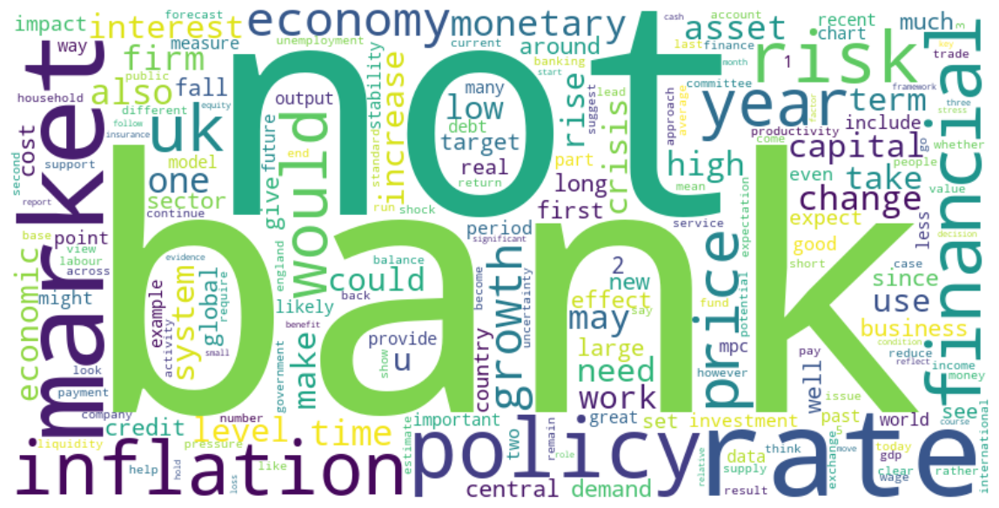

In [110]:
# Create wordcloud of lemmatised text
plot_top_non_stopwords_wordcloud(boe_speeches['text_lemmatised_str'])

In [111]:
# Define bar chart for top words
def top_words_barchart(text):
    stop=set(stopwords.words('english'))
    
    new= text.str.split()
    new=new.values.tolist()
    corpus=[word for i in new for word in i]

    counter=Counter(corpus)
    most=counter.most_common()
    x, y=[], []
    for word,count in most[:40]:
        if (word not in stop):
            x.append(word)
            y.append(count)
            
    # Set plot size
    plt.figure(figsize=(12, 8))
    
    # Plot
    sns.barplot(x=y, y=x)
    
    # Set label font sizes
    plt.xlabel('Count', fontsize=14)
    plt.ylabel('Words', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    
    plt.title('Top Non-Stopword Words', fontsize=16)
    plt.tight_layout()
    plt.show()

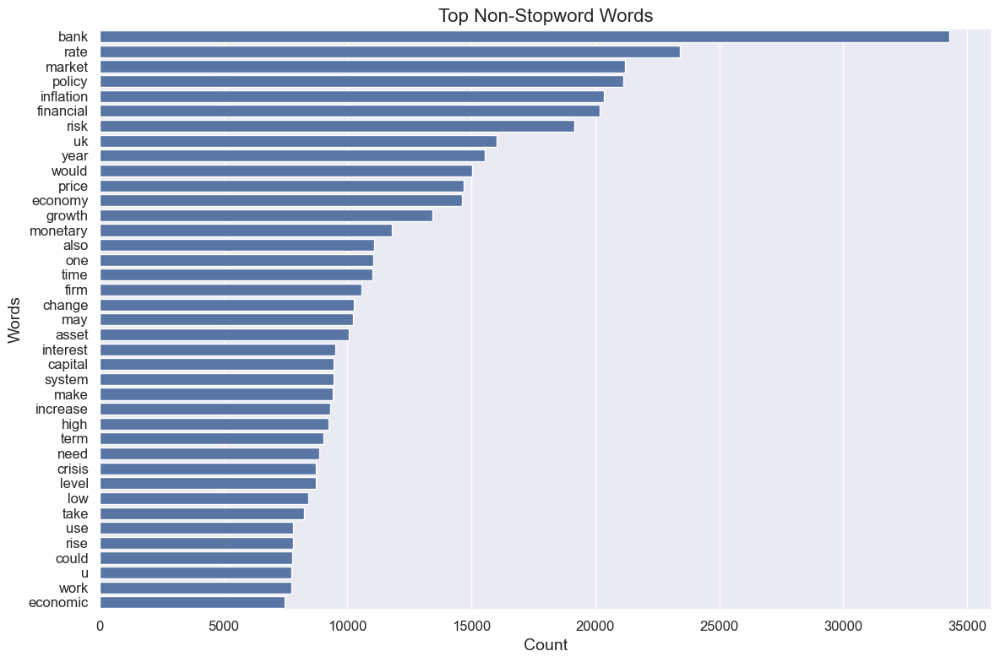

In [112]:
# Create bar chart to show top words
top_words_barchart(boe_speeches['text_lemmatised_str'])

In [113]:
# Define bar chart for top word groups
def top_word_group_barchart(text, n=2):
    stop=set(stopwords.words('english'))

    new= text.str.split()
    new=new.values.tolist()
    corpus=[word for i in new for word in i]

    def _get_top_ngram(corpus, n=None):
        vec = CountVectorizer(ngram_range=(n, n)).fit(corpus)
        bag_of_words = vec.transform(corpus)
        sum_words = bag_of_words.sum(axis=0) 
        words_freq = [(word, sum_words[0, idx]) 
                      for word, idx in vec.vocabulary_.items()]
        words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
        return words_freq[:10]

    top_n_bigrams=_get_top_ngram(text,n)[:10]
    x,y=map(list,zip(*top_n_bigrams))
    sns.barplot(x=y,y=x)

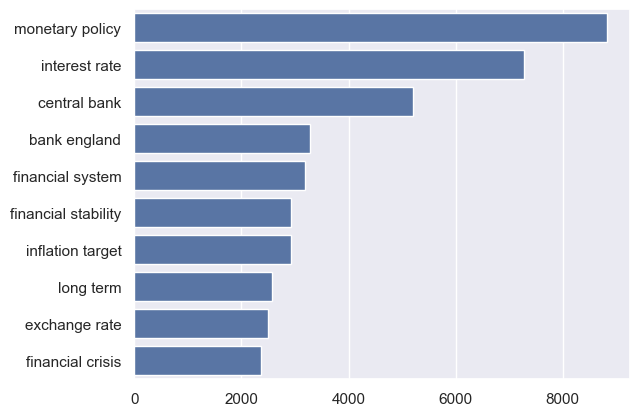

In [114]:
# Plot top phrases with 2 words
top_word_group_barchart(boe_speeches['text_lemmatised_str'],2)

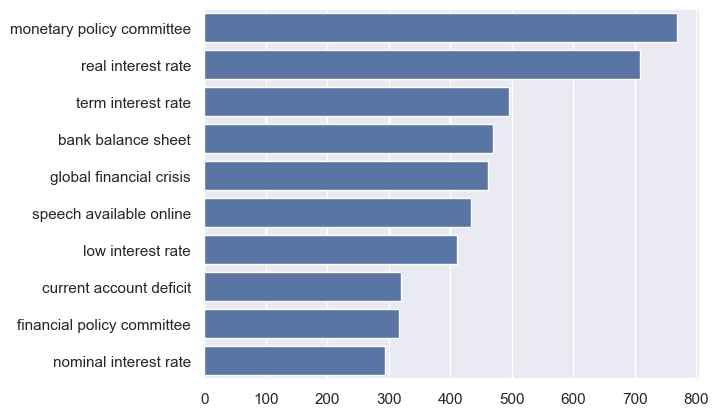

In [115]:
# Plot top phrases with 3 words
top_word_group_barchart(boe_speeches['text_lemmatised_str'],3)

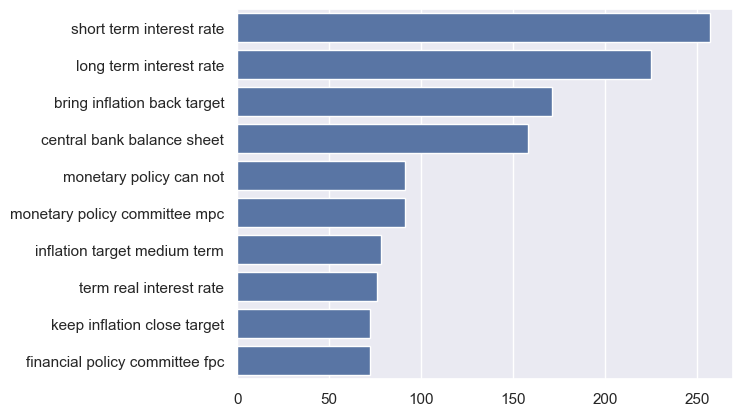

In [116]:
# Plot top phrases with 4 words
top_word_group_barchart(boe_speeches['text_lemmatised_str'],4)

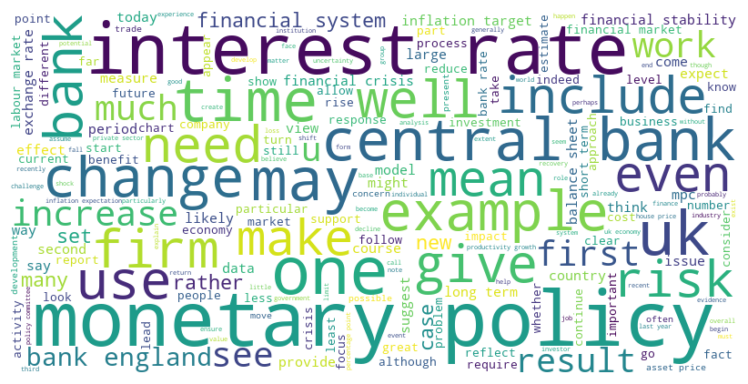

In [117]:
# Convert tokens into a single string.
boe_speeches_text = ' '.join(boe_speeches['text_lemmatised_str'])

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', random_state=42).generate(boe_speeches_text)

# Display the word cloud
plt.figure(figsize=(8, 4))
plt.imshow(wordcloud, interpolation='bilinear')

# Hide the axis.
plt.axis('off') 

# Dispaly the word cloud.
plt.tight_layout()
plt.show()

### 3.3. Sentiment Analysis with BoE Sentiment Wordlist for BoE speeches

In [130]:
# Prepare the lexicon
sentiment_lexicon = sentiment_lexicon.copy()

# Define categories
categories = [
     'Negative',
     'Positive',
     'Uncertainty',
     'Litigious',
     'Strong',
     'Weak',
     'Constraining',
 ]

# Create dictionary of categories, containing words that belong to that category based on your sentiment lexicon.
word_sets = {
    cat: set(sentiment_lexicon.loc[sentiment_lexicon[cat] == 1, 'Word'].str.lower())
    for cat in categories
}

In [132]:
# Define function to apply the lexicon to the text
def lexicon_counts(tokens):
    return pd.Series({
        cat: sum(t in word_sets[cat] for t in tokens)
        for cat in categories
    })

# Compute counts and add new columns for each category
boe_speeches = pd.concat(
    [boe_speeches, boe_speeches['text_lemmatised'].apply(lexicon_counts)], axis=1
 )

boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,text_lemmatised,text_lemmatised_str,word_count,Negative,Positive,Uncertainty,Litigious,Strong,Weak,Constraining
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,"[thank, chairman, actually, pleased, opportuni...",thank chairman actually pleased opportunity re...,1162,62,39,24,3,14,16,2
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,"[great, pleasure, beautiful, city, bruges, hon...",great pleasure beautiful city bruges honour op...,2108,80,88,51,6,10,28,17
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,"[industry, suffer, volatility, british, econom...",industry suffer volatility british economy pas...,1240,63,32,49,2,3,15,6
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,"[topic, evening, use, forecast, economic, poli...",topic evening use forecast economic policy mak...,2380,79,42,91,12,14,42,15
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,"[six, year, ago, week, sterling, leave, exchan...",six year ago week sterling leave exchange rate...,2580,102,46,113,22,13,48,12


In [133]:
# Calculate the sentiment score by subtracting the negative score from the positive score and dividing by the total number of words
boe_speeches['sentiment_score_lexicon'] = (boe_speeches['Positive'] - boe_speeches['Negative'])/ boe_speeches['word_count']

# View the DataFrame.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,text_lemmatised_str,word_count,Negative,Positive,Uncertainty,Litigious,Strong,Weak,Constraining,sentiment_score_lexicon
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,thank chairman actually pleased opportunity re...,1162,62,39,24,3,14,16,2,-0.019793
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,great pleasure beautiful city bruges honour op...,2108,80,88,51,6,10,28,17,0.003795
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,industry suffer volatility british economy pas...,1240,63,32,49,2,3,15,6,-0.025000
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,topic evening use forecast economic policy mak...,2380,79,42,91,12,14,42,15,-0.015546
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,six year ago week sterling leave exchange rate...,2580,102,46,113,22,13,48,12,-0.021705


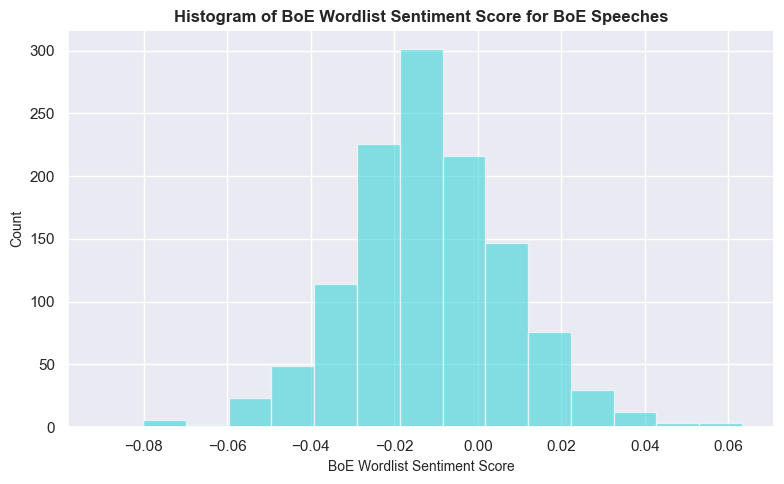

In [136]:
# Plot a histogram of the vader sentiment score for summary
# Set the number of bins.
num_bins = 15
# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(boe_speeches['sentiment_score_lexicon'], num_bins, facecolor='#3bd5d7', alpha=0.6)

# Set the labels.
plt.xlabel('BoE Wordlist Sentiment Score', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Histogram of BoE Wordlist Sentiment Score for BoE Speeches', fontsize=12, fontweight='bold')

# Display the chart.
plt.tight_layout()
plt.show()

In [138]:
# View distribution of sentiment scores
boe_speeches['sentiment_score_lexicon'].describe()

count    1209.000000
mean       -0.011770
std         0.019079
min        -0.090339
25%        -0.023582
50%        -0.012294
75%        -0.000405
max         0.063218
Name: sentiment_score_lexicon, dtype: float64

In [140]:
# Standardise the sentiment score
# Calculate mean and standard deviation
mean_score = boe_speeches['sentiment_score_lexicon'].mean()
std_score = boe_speeches['sentiment_score_lexicon'].std()

# Create a new column for standardized scores
boe_speeches['sentiment_score_lexicon_std'] = (boe_speeches['sentiment_score_lexicon'] - mean_score) / std_score

# View the DataFrame.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,word_count,Negative,Positive,Uncertainty,Litigious,Strong,Weak,Constraining,sentiment_score_lexicon,sentiment_score_lexicon_std
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,1162,62,39,24,3,14,16,2,-0.019793,-0.420532
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,2108,80,88,51,6,10,28,17,0.003795,0.815821
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,1240,63,32,49,2,3,15,6,-0.025000,-0.693424
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,2380,79,42,91,12,14,42,15,-0.015546,-0.197920
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,2580,102,46,113,22,13,48,12,-0.021705,-0.520744


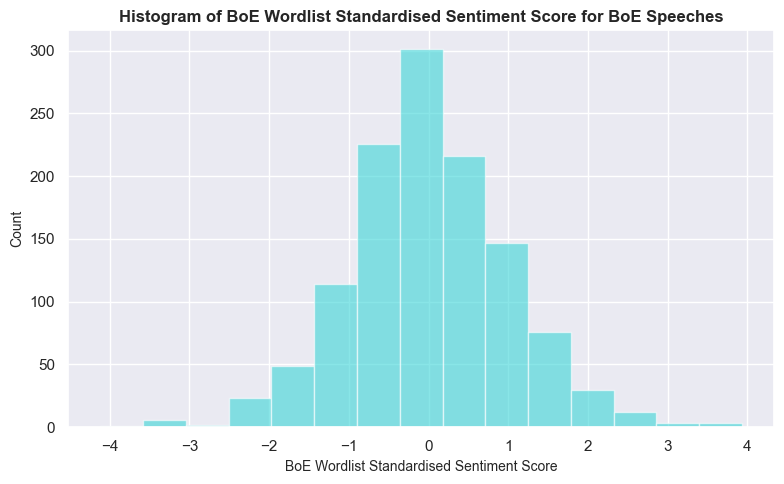

In [142]:
# Plot a histogram of the vader sentiment score for summary
# Set the number of bins.
num_bins = 15
# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(boe_speeches['sentiment_score_lexicon_std'], num_bins, facecolor='#3bd5d7', alpha=0.6)

# Set the labels.
plt.xlabel('BoE Wordlist Standardised Sentiment Score', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Histogram of BoE Wordlist Standardised Sentiment Score for BoE Speeches', fontsize=12, fontweight='bold')

# Display the chart.
plt.tight_layout()
plt.show()

In [144]:
# View distribution of sentiment scores
boe_speeches['sentiment_score_lexicon_std'].describe()

count    1.209000e+03
mean     9.403378e-17
std      1.000000e+00
min     -4.118045e+00
25%     -6.190852e-01
50%     -2.745708e-02
75%      5.956975e-01
max      3.930394e+00
Name: sentiment_score_lexicon_std, dtype: float64

In [148]:
# Categories sentiment according to sentiment score
def categorise_sentiment(sentiment_score):
    if sentiment_score >= 1:
        return 'Positive'
    elif sentiment_score <= -1:
        return 'Negative'
    else:
        return 'Neutral'

In [150]:
# Apply the sentiment labels to speeches
boe_speeches['lexicon_label'] = boe_speeches['sentiment_score_lexicon_std'].apply(categorise_sentiment)

# View the DataFrame.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,Negative,Positive,Uncertainty,Litigious,Strong,Weak,Constraining,sentiment_score_lexicon,sentiment_score_lexicon_std,lexicon_label
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,62,39,24,3,14,16,2,-0.019793,-0.420532,Neutral
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,80,88,51,6,10,28,17,0.003795,0.815821,Neutral
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,63,32,49,2,3,15,6,-0.025000,-0.693424,Neutral
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,79,42,91,12,14,42,15,-0.015546,-0.197920,Neutral
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,102,46,113,22,13,48,12,-0.021705,-0.520744,Neutral


In [152]:
# Categories sentiment according to percentile thresholds
lower_thresh = boe_speeches['sentiment_score_lexicon_std'].quantile(0.20)
upper_thresh = boe_speeches['sentiment_score_lexicon_std'].quantile(0.80)

def classify_score(z):
    if z >= upper_thresh:
        return 'Positive'
    elif z <= lower_thresh:
        return 'Negative'
    else:
        return 'Neutral'

In [154]:
# Apply the sentiment labels to speeches
boe_speeches['lexicon_label_percentile'] = boe_speeches['sentiment_score_lexicon_std'].apply(classify_score)

# View the DataFrame.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,Positive,Uncertainty,Litigious,Strong,Weak,Constraining,sentiment_score_lexicon,sentiment_score_lexicon_std,lexicon_label,lexicon_label_percentile
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,39,24,3,14,16,2,-0.019793,-0.420532,Neutral,Neutral
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,88,51,6,10,28,17,0.003795,0.815821,Neutral,Positive
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,32,49,2,3,15,6,-0.025000,-0.693424,Neutral,Neutral
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,42,91,12,14,42,15,-0.015546,-0.197920,Neutral,Neutral
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,46,113,22,13,48,12,-0.021705,-0.520744,Neutral,Neutral


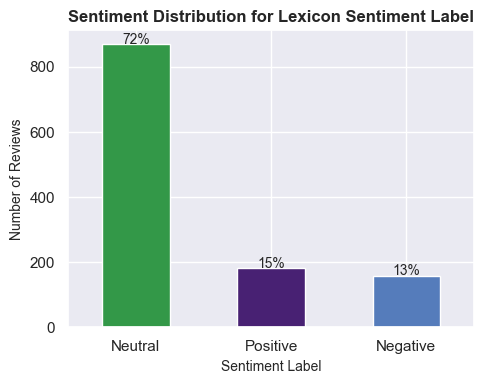

In [156]:
# Plot the sentiments distribution for lexicon label
sentiment_labels_lexicon = boe_speeches['lexicon_label']

# Create a figure
plt.figure(figsize=(5, 4))

# Calculate the counts and percentages
sentiment_counts = pd.Series(sentiment_labels_lexicon.value_counts())
sentiment_percentages = sentiment_counts / sentiment_counts.sum() * 100  # Calculate percentages

# Plot the bar chart
sentiment_counts.plot(kind='bar', color=['#339848', '#482173', '#557cbb'])

# Add labels.
plt.title('Sentiment Distribution for Lexicon Sentiment Label', fontsize=12, fontweight='bold')
plt.xlabel('Sentiment Label', fontsize=10)
plt.ylabel('Number of Reviews', fontsize=10)
plt.xticks(rotation=0)

# Annotate the bars with percentages
for index, value in enumerate(sentiment_counts):
    plt.text(index, value + 0.5, f'{sentiment_percentages[index]:.0f}%', ha='center', fontsize=10)

# Save the plot.
# plt.savefig('Fig_Sentiment_Reviews.png', dpi=500, bbox_inches='tight')

# Display the plot.
plt.tight_layout()
plt.show()

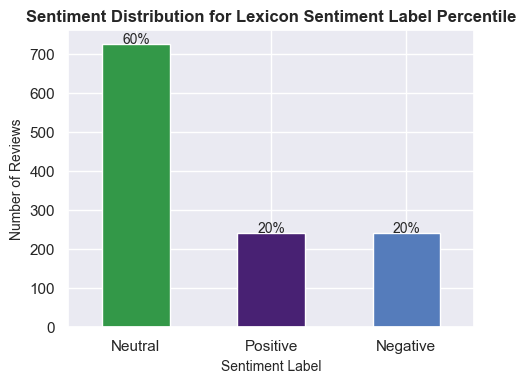

In [158]:
# Plot the sentiments distribution for lexicon percentile
sentiment_labels_lexicon_percentile = boe_speeches['lexicon_label_percentile']

# Create a figure
plt.figure(figsize=(5, 4))

# Calculate the counts and percentages
sentiment_counts = pd.Series(sentiment_labels_lexicon_percentile.value_counts())
sentiment_percentages = sentiment_counts / sentiment_counts.sum() * 100  # Calculate percentages

# Plot the bar chart
sentiment_counts.plot(kind='bar', color=['#339848', '#482173', '#557cbb'])

# Add labels.
plt.title('Sentiment Distribution for Lexicon Sentiment Label Percentile', fontsize=12, fontweight='bold')
plt.xlabel('Sentiment Label', fontsize=10)
plt.ylabel('Number of Reviews', fontsize=10)
plt.xticks(rotation=0)

# Annotate the bars with percentages
for index, value in enumerate(sentiment_counts):
    plt.text(index, value + 0.5, f'{sentiment_percentages[index]:.0f}%', ha='center', fontsize=10)

# Save the plot.
# plt.savefig('Fig_Sentiment_Reviews.png', dpi=500, bbox_inches='tight')

# Display the plot.
plt.tight_layout()
plt.show()

### 3.4. Sentiment Analysis with Custom Dictionary

In [160]:
# Prepare the lexicon
custom = custom_dict.copy()

categories = [
     'negative_custom',
     'positive_custom',
     'uncertainty_custom'
 ]

word_sets = {
    cat: set(custom.loc[custom[cat] == 1, 'Word'].str.lower())
    for cat in categories
}

In [162]:
# Compute counts and add new columns for each category
boe_speeches = pd.concat(
    [boe_speeches, boe_speeches['text_lemmatised'].apply(lexicon_counts)], axis=1
 )

boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,Strong,Weak,Constraining,sentiment_score_lexicon,sentiment_score_lexicon_std,lexicon_label,lexicon_label_percentile,negative_custom,positive_custom,uncertainty_custom
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,14,16,2,-0.019793,-0.420532,Neutral,Neutral,6,0,9
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,10,28,17,0.003795,0.815821,Neutral,Positive,3,0,12
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,3,15,6,-0.025000,-0.693424,Neutral,Neutral,4,3,4
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,14,42,15,-0.015546,-0.197920,Neutral,Neutral,5,0,86
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,13,48,12,-0.021705,-0.520744,Neutral,Neutral,19,0,24


In [164]:
# Calculate the sentiment score by subtracting the negative score from the positive score and dividing by total number of words
boe_speeches['sentiment_score_custom'] = (boe_speeches['positive_custom'] - boe_speeches['negative_custom'])/ boe_speeches['word_count']

# View the DataFrame.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,Weak,Constraining,sentiment_score_lexicon,sentiment_score_lexicon_std,lexicon_label,lexicon_label_percentile,negative_custom,positive_custom,uncertainty_custom,sentiment_score_custom
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,16,2,-0.019793,-0.420532,Neutral,Neutral,6,0,9,-0.005164
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,28,17,0.003795,0.815821,Neutral,Positive,3,0,12,-0.001423
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,15,6,-0.025000,-0.693424,Neutral,Neutral,4,3,4,-0.000806
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,42,15,-0.015546,-0.197920,Neutral,Neutral,5,0,86,-0.002101
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,48,12,-0.021705,-0.520744,Neutral,Neutral,19,0,24,-0.007364


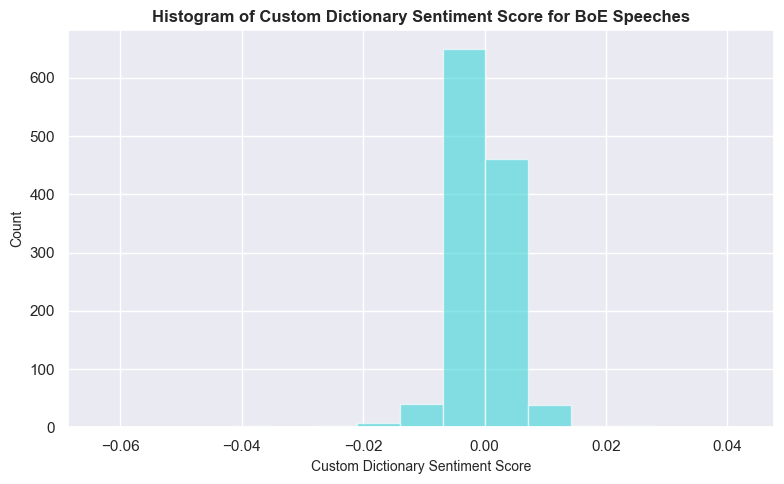

In [166]:
# Plot a histogram of the vader sentiment score for summary
# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(boe_speeches['sentiment_score_custom'], num_bins, facecolor='#3bd5d7', alpha=0.6)

# Set the labels.
plt.xlabel('Custom Dictionary Sentiment Score', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Histogram of Custom Dictionary Sentiment Score for BoE Speeches', fontsize=12, fontweight='bold')

# Display the chart.
plt.tight_layout()
plt.show()

In [168]:
# View distribution of sentiment scores
boe_speeches['sentiment_score_custom'].describe()

count    1209.000000
mean       -0.000129
std         0.004979
min        -0.063301
25%        -0.001594
50%         0.000000
75%         0.001336
max         0.042424
Name: sentiment_score_custom, dtype: float64

In [170]:
# Standardise the sentiment score
# Calculate mean and standard deviation
mean_score_custom = boe_speeches['sentiment_score_custom'].mean()
std_score_custom = boe_speeches['sentiment_score_custom'].std()

# Create a new column for standardized scores
boe_speeches['sentiment_score_custom_std'] = (boe_speeches['sentiment_score_custom'] - mean_score_custom) / std_score_custom

# View the DataFrame.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,Constraining,sentiment_score_lexicon,sentiment_score_lexicon_std,lexicon_label,lexicon_label_percentile,negative_custom,positive_custom,uncertainty_custom,sentiment_score_custom,sentiment_score_custom_std
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,2,-0.019793,-0.420532,Neutral,Neutral,6,0,9,-0.005164,-1.011042
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,17,0.003795,0.815821,Neutral,Positive,3,0,12,-0.001423,-0.259869
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,6,-0.025000,-0.693424,Neutral,Neutral,4,3,4,-0.000806,-0.136018
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,15,-0.015546,-0.197920,Neutral,Neutral,5,0,86,-0.002101,-0.395969
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,12,-0.021705,-0.520744,Neutral,Neutral,19,0,24,-0.007364,-1.453032


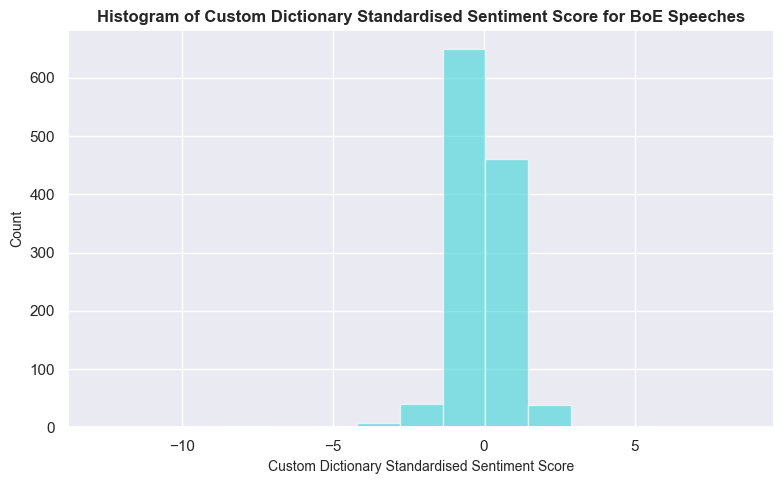

In [172]:
# Plot a histogram of the vader sentiment score for summary
# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(boe_speeches['sentiment_score_custom_std'], num_bins, facecolor='#3bd5d7', alpha=0.6)

# Set the labels.
plt.xlabel('Custom Dictionary Standardised Sentiment Score', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Histogram of Custom Dictionary Standardised Sentiment Score for BoE Speeches', fontsize=12, fontweight='bold')

# Display the chart.
plt.tight_layout()
plt.show()

In [174]:
# View distribution of sentiment scores
boe_speeches['sentiment_score_custom_std'].describe()

count    1.209000e+03
mean    -3.526267e-17
std      1.000000e+00
min     -1.268676e+01
25%     -2.941055e-01
50%      2.594062e-02
75%      2.943388e-01
max      8.545956e+00
Name: sentiment_score_custom_std, dtype: float64

In [176]:
# Apply the sentiment labels to speeches
boe_speeches['custom_label'] = boe_speeches['sentiment_score_custom_std'].apply(categorise_sentiment)

# View the DataFrame.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,sentiment_score_lexicon,sentiment_score_lexicon_std,lexicon_label,lexicon_label_percentile,negative_custom,positive_custom,uncertainty_custom,sentiment_score_custom,sentiment_score_custom_std,custom_label
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,-0.019793,-0.420532,Neutral,Neutral,6,0,9,-0.005164,-1.011042,Negative
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,0.003795,0.815821,Neutral,Positive,3,0,12,-0.001423,-0.259869,Neutral
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,-0.025000,-0.693424,Neutral,Neutral,4,3,4,-0.000806,-0.136018,Neutral
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,-0.015546,-0.197920,Neutral,Neutral,5,0,86,-0.002101,-0.395969,Neutral
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,-0.021705,-0.520744,Neutral,Neutral,19,0,24,-0.007364,-1.453032,Negative


In [178]:
# Categories sentiment according to percentile thresholds
lower_thresh = boe_speeches['sentiment_score_custom_std'].quantile(0.20)
upper_thresh = boe_speeches['sentiment_score_custom_std'].quantile(0.80)

In [180]:
# Apply the sentiment labels to speeches
boe_speeches['custom_label_percentile'] = boe_speeches['sentiment_score_custom_std'].apply(classify_score)

# View the DataFrame.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,sentiment_score_lexicon_std,lexicon_label,lexicon_label_percentile,negative_custom,positive_custom,uncertainty_custom,sentiment_score_custom,sentiment_score_custom_std,custom_label,custom_label_percentile
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,-0.420532,Neutral,Neutral,6,0,9,-0.005164,-1.011042,Negative,Negative
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,0.815821,Neutral,Positive,3,0,12,-0.001423,-0.259869,Neutral,Neutral
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,-0.693424,Neutral,Neutral,4,3,4,-0.000806,-0.136018,Neutral,Neutral
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,-0.197920,Neutral,Neutral,5,0,86,-0.002101,-0.395969,Neutral,Negative
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,-0.520744,Neutral,Neutral,19,0,24,-0.007364,-1.453032,Negative,Negative


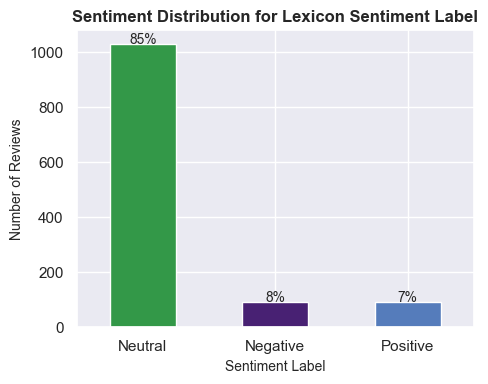

In [182]:
# Plot the sentiments distribution for lexicon label
sentiment_labels_custom = boe_speeches['custom_label']

# Create a figure
plt.figure(figsize=(5, 4))

# Calculate the counts and percentages
sentiment_counts = pd.Series(sentiment_labels_custom.value_counts())
sentiment_percentages = sentiment_counts / sentiment_counts.sum() * 100  # Calculate percentages

# Plot the bar chart
sentiment_counts.plot(kind='bar', color=['#339848', '#482173', '#557cbb'])

# Add labels.
plt.title('Sentiment Distribution for Lexicon Sentiment Label', fontsize=12, fontweight='bold')
plt.xlabel('Sentiment Label', fontsize=10)
plt.ylabel('Number of Reviews', fontsize=10)
plt.xticks(rotation=0)

# Annotate the bars with percentages
for index, value in enumerate(sentiment_counts):
    plt.text(index, value + 0.5, f'{sentiment_percentages[index]:.0f}%', ha='center', fontsize=10)

# Save the plot.
# plt.savefig('Fig_Sentiment_Reviews.png', dpi=500, bbox_inches='tight')

# Display the plot.
plt.tight_layout()
plt.show()

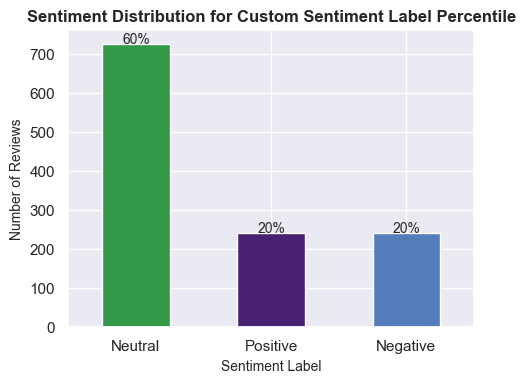

In [184]:
# Plot the sentiments distribution for lexicon percentile
sentiment_labels_custom_percentile = boe_speeches['custom_label_percentile']

# Create a figure
plt.figure(figsize=(5, 4))

# Calculate the counts and percentages
sentiment_counts = pd.Series(sentiment_labels_lexicon_percentile.value_counts())
sentiment_percentages = sentiment_counts / sentiment_counts.sum() * 100  # Calculate percentages

# Plot the bar chart
sentiment_counts.plot(kind='bar', color=['#339848', '#482173', '#557cbb'])

# Add labels.
plt.title('Sentiment Distribution for Custom Sentiment Label Percentile', fontsize=12, fontweight='bold')
plt.xlabel('Sentiment Label', fontsize=10)
plt.ylabel('Number of Reviews', fontsize=10)
plt.xticks(rotation=0)

# Annotate the bars with percentages
for index, value in enumerate(sentiment_counts):
    plt.text(index, value + 0.5, f'{sentiment_percentages[index]:.0f}%', ha='center', fontsize=10)

# Save the plot.
# plt.savefig('Fig_Sentiment_Reviews.png', dpi=500, bbox_inches='tight')

# Display the plot.
plt.tight_layout()
plt.show()

**Observation**: The custom lexicon gives interesting results, however, it is limiting to only include 39 words in the analysis.

### 3.5. Sentiment Analysis with FinBERT for BoE speeches using yiyanghkurts model

In [186]:
# Define a function to predict probabilities in batches
def predict_batch(texts, tokenizer, model, max_length=128):
    inputs = tokenizer(texts, padding=True, truncation=True, max_length=max_length, return_tensors='pt')  # Tokenize batch of texts
    inputs = {k: v.to(device) for k, v in inputs.items()}                 # Move inputs to the device (GPU or CPU)
    with torch.no_grad():                                                 # Get model outputs without computing gradients
        outputs = model(**inputs)
    probs = F.softmax(outputs.logits, dim=1)                              # Convert logits to probabilities
    return probs.cpu().numpy()

In [188]:
# Check the order of labels in the model
model_yiyang.config.id2label

{0: 'Neutral', 1: 'Positive', 2: 'Negative'}

In [190]:
# Column that the model should be applied to
texts = boe_speeches['text_lemmatised'].astype(str).tolist()

# Specify batch size for efficiency
batch_size = 32
all_probs = []

for i in range(0, len(texts), batch_size):
    batch_texts = texts[i:i + batch_size]
    batch_probs = predict_batch(batch_texts, tokenizer_yiyang, model_yiyang)
    all_probs.extend(batch_probs)

# Store the predicted probabilities back into your DataFrame
boe_speeches['yiyang_probs'] = all_probs

# Extract top labels using the order established above
labels = ['Neutral', 'Positive', 'Negative']

def get_probs_yiyang_dict(probs):
    # Assumes probs is an array/list like [neutral_score, positive_score, negative_score]
    return {
        'yiyang_neutral': probs[0],
        'yiyang_positive': probs[1],
        'yiyang_negative': probs[2]
    }

def get_top_label(probs):
    idx = probs.argmax()
    return labels[idx], probs.max()

In [192]:
# Create a DataFrame with all class probabilities
probs_yiyang = boe_speeches['yiyang_probs'].apply(lambda x: get_probs_yiyang_dict(x)).apply(pd.Series)

# Assign back to your main DataFrame
boe_speeches = pd.concat([boe_speeches, probs_yiyang], axis=1)

# Apply and extract label + confidence
boe_speeches[['yiyang_label', 'yiyang_confidence']] = boe_speeches['yiyang_probs'].apply(lambda x: get_top_label(x)).apply(pd.Series)

# Now, your DataFrame has the probabilities, top label, and confidence score
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,sentiment_score_custom,sentiment_score_custom_std,custom_label,custom_label_percentile,yiyang_probs,yiyang_neutral,yiyang_positive,yiyang_negative,yiyang_label,yiyang_confidence
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,-0.005164,-1.011042,Negative,Negative,"[0.4900095, 0.5094528, 0.00053772976]",0.490009,0.509453,0.000538,Positive,0.509453
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,-0.001423,-0.259869,Neutral,Neutral,"[0.969261, 0.030696781, 4.2198746e-05]",0.969261,0.030697,0.000042,Neutral,0.969261
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,-0.000806,-0.136018,Neutral,Neutral,"[0.37933072, 0.021060491, 0.5996088]",0.379331,0.021060,0.599609,Negative,0.599609
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,-0.002101,-0.395969,Neutral,Negative,"[0.9847193, 0.0149205, 0.00036025542]",0.984719,0.014921,0.000360,Neutral,0.984719
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,-0.007364,-1.453032,Negative,Negative,"[0.9990752, 0.0009056315, 1.9160354e-05]",0.999075,0.000906,0.000019,Neutral,0.999075


In [196]:
# Define weights 
weights = {
    'Positive': 1,
    'Neutral': 0,
    'Negative': -1
}

In [198]:
# Define function to calculate one sentiment score
def compute_tone_score(probs):
    class_labels = ['Neutral', 'Positive', 'Negative']
    prob_dict = dict(zip(class_labels, probs))
    return (
        prob_dict['Positive'] * weights['Positive'] +
        prob_dict['Neutral'] * weights['Neutral'] +
        prob_dict['Negative'] * weights['Negative']
    )

In [200]:
# Apply to all rows
boe_speeches['sentiment_score_yiyang'] = boe_speeches['yiyang_probs'].apply(compute_tone_score)

# View the dataframe
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,sentiment_score_custom_std,custom_label,custom_label_percentile,yiyang_probs,yiyang_neutral,yiyang_positive,yiyang_negative,yiyang_label,yiyang_confidence,sentiment_score_yiyang
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,-1.011042,Negative,Negative,"[0.4900095, 0.5094528, 0.00053772976]",0.490009,0.509453,0.000538,Positive,0.509453,0.508915
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,-0.259869,Neutral,Neutral,"[0.969261, 0.030696781, 4.2198746e-05]",0.969261,0.030697,0.000042,Neutral,0.969261,0.030655
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,-0.136018,Neutral,Neutral,"[0.37933072, 0.021060491, 0.5996088]",0.379331,0.021060,0.599609,Negative,0.599609,-0.578548
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,-0.395969,Neutral,Negative,"[0.9847193, 0.0149205, 0.00036025542]",0.984719,0.014921,0.000360,Neutral,0.984719,0.014560
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,-1.453032,Negative,Negative,"[0.9990752, 0.0009056315, 1.9160354e-05]",0.999075,0.000906,0.000019,Neutral,0.999075,0.000886


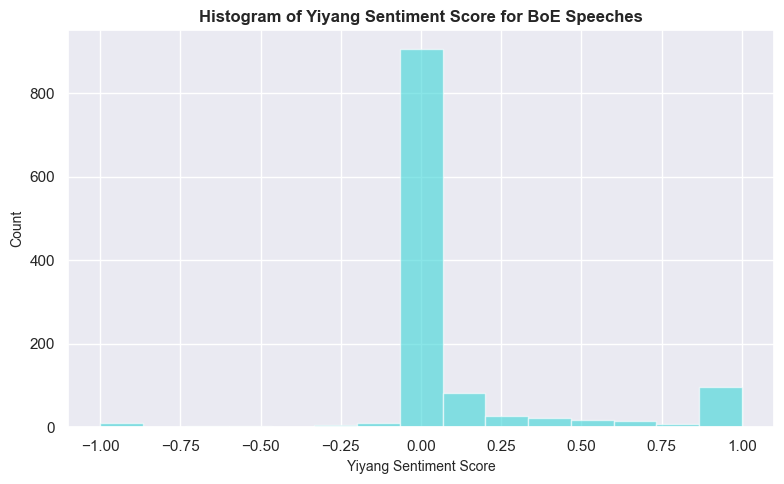

In [202]:
# Plot a histogram of the confidence score for BoE speeches
# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(8,5))

# Define the plot.
n, bins, patches = plt.hist(boe_speeches['sentiment_score_yiyang'], num_bins, facecolor='#3bd5d7', alpha=0.6)

# Set the labels.
plt.xlabel('Yiyang Sentiment Score', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Histogram of Yiyang Sentiment Score for BoE Speeches', fontsize=12, fontweight='bold')

# Display the chart.
plt.tight_layout()
plt.show()

In [204]:
# Standardise the sentiment score
# Calculate mean and standard deviation
mean_score_yiyang = boe_speeches['sentiment_score_yiyang'].mean()
std_score_yiyang = boe_speeches['sentiment_score_yiyang'].std()

# Create a new column for standardized scores
boe_speeches['sentiment_score_yiyang_std'] = (boe_speeches['sentiment_score_yiyang'] - mean_score_yiyang) / std_score_yiyang

# View the DataFrame.
boe_speeches.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,custom_label,custom_label_percentile,yiyang_probs,yiyang_neutral,yiyang_positive,yiyang_negative,yiyang_label,yiyang_confidence,sentiment_score_yiyang,sentiment_score_yiyang_std
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,Negative,Negative,"[0.4900095, 0.5094528, 0.00053772976]",0.490009,0.509453,0.000538,Positive,0.509453,0.508915,1.291954
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,Neutral,Neutral,"[0.969261, 0.030696781, 4.2198746e-05]",0.969261,0.030697,0.000042,Neutral,0.969261,0.030655,-0.260091
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,Neutral,Neutral,"[0.37933072, 0.021060491, 0.5996088]",0.379331,0.021060,0.599609,Negative,0.599609,-0.578548,-2.237069
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,Neutral,Negative,"[0.9847193, 0.0149205, 0.00036025542]",0.984719,0.014921,0.000360,Neutral,0.984719,0.014560,-0.312321
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,Negative,Negative,"[0.9990752, 0.0009056315, 1.9160354e-05]",0.999075,0.000906,0.000019,Neutral,0.999075,0.000886,-0.356694


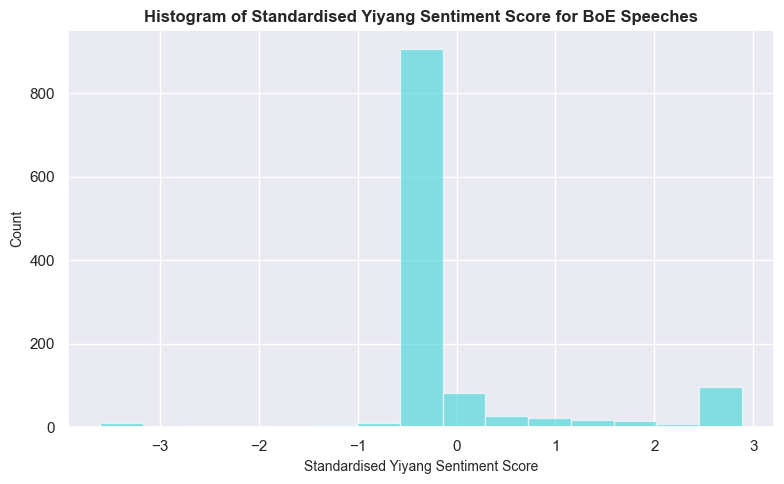

In [206]:
# Plot a histogram of the standardised sentiment score for BoE speeches
# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(8,5))

# Define the plot.
n, bins, patches = plt.hist(boe_speeches['sentiment_score_yiyang_std'], num_bins, facecolor='#3bd5d7', alpha=0.6)

# Set the labels.
plt.xlabel('Standardised Yiyang Sentiment Score', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Histogram of Standardised Yiyang Sentiment Score for BoE Speeches', fontsize=12, fontweight='bold')

# Display the chart.
plt.tight_layout()
plt.show()

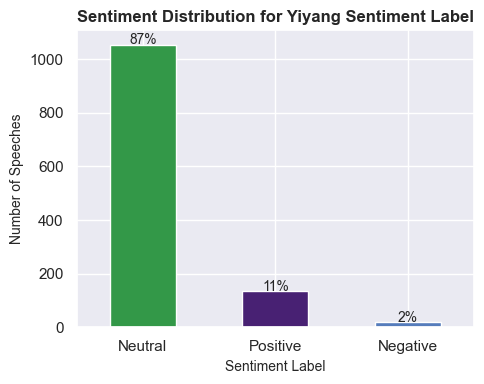

In [208]:
# Plot the sentiments distribution for yiyang
sentiment_labels_yiyang = boe_speeches['yiyang_label']

# Create a figure
plt.figure(figsize=(5, 4))

# Calculate the counts and percentages
sentiment_counts = pd.Series(sentiment_labels_yiyang.value_counts())
sentiment_percentages = sentiment_counts / sentiment_counts.sum() * 100  # Calculate percentages

# Plot the bar chart
sentiment_counts.plot(kind='bar', color=['#339848', '#482173', '#557cbb'])

# Add labels.
plt.title('Sentiment Distribution for Yiyang Sentiment Label', fontsize=12, fontweight='bold')
plt.xlabel('Sentiment Label', fontsize=10)
plt.ylabel('Number of Speeches', fontsize=10)
plt.xticks(rotation=0)

# Annotate the bars with percentages
for index, value in enumerate(sentiment_counts):
    plt.text(index, value + 0.5, f'{sentiment_percentages[index]:.0f}%', ha='center', fontsize=10)

# Save the plot.
# plt.savefig('Fig_Sentiment_Reviews.png', dpi=500, bbox_inches='tight')

# Display the plot.
plt.tight_layout()
plt.show()

In [210]:
# View the weighted Sentiment scores.
boe_speeches['sentiment_score_yiyang'].describe()

count    1209.000000
mean        0.110801
std         0.308149
min        -0.998919
25%         0.000640
50%         0.004308
75%         0.043896
max         1.000000
Name: sentiment_score_yiyang, dtype: float64

### 3.6. GPT Results

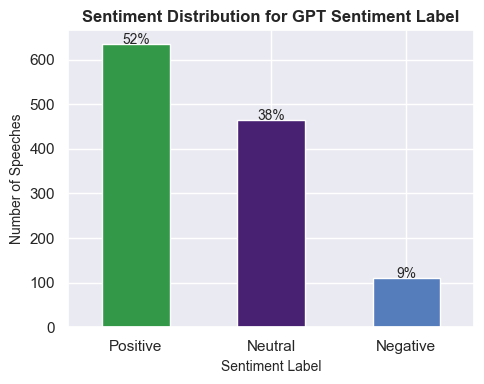

In [213]:
# Plot the sentiments distribution for yiyang
sentiment_labels_gpt = gpt_sentiment['Gpt_sentiment']

# Create a figure
plt.figure(figsize=(5, 4))

# Calculate the counts and percentages
sentiment_counts = pd.Series(sentiment_labels_gpt.value_counts())
sentiment_percentages = sentiment_counts / sentiment_counts.sum() * 100  # Calculate percentages

# Plot the bar chart
sentiment_counts.plot(kind='bar', color=['#339848', '#482173', '#557cbb'])

# Add labels.
plt.title('Sentiment Distribution for GPT Sentiment Label', fontsize=12, fontweight='bold')
plt.xlabel('Sentiment Label', fontsize=10)
plt.ylabel('Number of Speeches', fontsize=10)
plt.xticks(rotation=0)

# Annotate the bars with percentages
for index, value in enumerate(sentiment_counts):
    plt.text(index, value + 0.5, f'{sentiment_percentages[index]:.0f}%', ha='center', fontsize=10)

# Save the plot.
# plt.savefig('Fig_Sentiment_Reviews.png', dpi=500, bbox_inches='tight')

# Display the plot.
plt.tight_layout()
plt.show()

### 3.6. Compare sentiment scores

Create a new dataframe with only relevant indices.

In [510]:
# Merge gpt_sentiment with boe_speeches
boe_speeches_new = pd.merge(boe_speeches, gpt_sentiment[['reference', 'Gpt_sentiment']], on='reference', how='left')

# View the DataFrame
boe_speeches_new.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year,...,custom_label_percentile,yiyang_probs,yiyang_neutral,yiyang_positive,yiyang_negative,yiyang_label,yiyang_confidence,sentiment_score_yiyang,sentiment_score_yiyang_std,Gpt_sentiment
0,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,Negative,"[0.4900095, 0.5094528, 0.00053772976]",0.490009,0.509453,0.000538,Positive,0.509453,0.508915,1.291954,Positive
1,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,Neutral,"[0.969261, 0.030696781, 4.2198746e-05]",0.969261,0.030697,0.000042,Neutral,0.969261,0.030655,-0.260091,Positive
2,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,Neutral,"[0.37933072, 0.021060491, 0.5996088]",0.379331,0.021060,0.599609,Negative,0.599609,-0.578548,-2.237069,Neutral
3,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,Negative,"[0.9847193, 0.0149205, 0.00036025542]",0.984719,0.014921,0.000360,Neutral,0.984719,0.014560,-0.312321,Neutral
4,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,Negative,"[0.9990752, 0.0009056315, 1.9160354e-05]",0.999075,0.000906,0.000019,Neutral,0.999075,0.000886,-0.356694,Positive


In [512]:
# Display all column names.
boe_speeches_new.columns

Index(['reference', 'country', 'date', 'title', 'author', 'is_gov', 'text',
       'date_format', 'year_month', 'year', 'year_month_dt', 'text_cleaned',
       'text_tokenised', 'text_lemmatised', 'text_lemmatised_str',
       'word_count', 'Negative', 'Positive', 'Uncertainty', 'Litigious',
       'Strong', 'Weak', 'Constraining', 'sentiment_score_lexicon',
       'sentiment_score_lexicon_std', 'lexicon_label',
       'lexicon_label_percentile', 'negative_custom', 'positive_custom',
       'uncertainty_custom', 'sentiment_score_custom',
       'sentiment_score_custom_std', 'custom_label', 'custom_label_percentile',
       'yiyang_probs', 'yiyang_neutral', 'yiyang_positive', 'yiyang_negative',
       'yiyang_label', 'yiyang_confidence', 'sentiment_score_yiyang',
       'sentiment_score_yiyang_std', 'Gpt_sentiment'],
      dtype='object')

In [516]:
# Create a new DataFrame with all sentiment scores to include for comparison.
boe_speeches_sentiment = boe_speeches_new[['reference', 'country', 'date', 'title', 'author', 'is_gov', 'text',
                                       'date_format', 'year_month', 'year_month_dt', 'year', 
                                       'text_lemmatised', 'text_lemmatised_str', 'word_count',
                                       'sentiment_score_lexicon_std', 'lexicon_label', 'lexicon_label_percentile', 
                                       'sentiment_score_custom_std', 'custom_label', 'custom_label_percentile',
                                       'sentiment_score_yiyang_std', 'yiyang_label', 'Gpt_sentiment']]

# View the DataFrame.
boe_speeches_sentiment.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year_month_dt,...,word_count,sentiment_score_lexicon_std,lexicon_label,lexicon_label_percentile,sentiment_score_custom_std,custom_label,custom_label_percentile,sentiment_score_yiyang_std,yiyang_label,Gpt_sentiment
0,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998-09-01,...,1162,-0.420532,Neutral,Neutral,-1.011042,Negative,Negative,1.291954,Positive,Positive
1,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998-10-01,...,2108,0.815821,Neutral,Positive,-0.259869,Neutral,Neutral,-0.260091,Neutral,Positive
2,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998-10-01,...,1240,-0.693424,Neutral,Neutral,-0.136018,Neutral,Neutral,-2.237069,Negative,Neutral
3,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998-11-01,...,2380,-0.197920,Neutral,Neutral,-0.395969,Neutral,Negative,-0.312321,Neutral,Neutral
4,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998-11-01,...,2580,-0.520744,Neutral,Neutral,-1.453032,Negative,Negative,-0.356694,Neutral,Positive


In [518]:
# Review the data
boe_speeches_sentiment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1209 entries, 0 to 1208
Data columns (total 23 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   reference                    1209 non-null   object        
 1   country                      1209 non-null   object        
 2   date                         1209 non-null   datetime64[ns]
 3   title                        1209 non-null   object        
 4   author                       1209 non-null   object        
 5   is_gov                       1209 non-null   int64         
 6   text                         1209 non-null   object        
 7   date_format                  1209 non-null   datetime64[ns]
 8   year_month                   1209 non-null   period[M]     
 9   year_month_dt                1209 non-null   datetime64[ns]
 10  year                         1209 non-null   int32         
 11  text_lemmatised              1209 non-null 

In [289]:
# Correlation between BoE dictionary and Finbert sentiment scores
from scipy.stats import pearsonr
corr, p_value = pearsonr(boe_speeches_sentiment['sentiment_score_lexicon_std'], boe_speeches_sentiment['sentiment_score_yiyang_std'])
print(f'Correlation: {corr:.2f}')

Correlation: 0.12


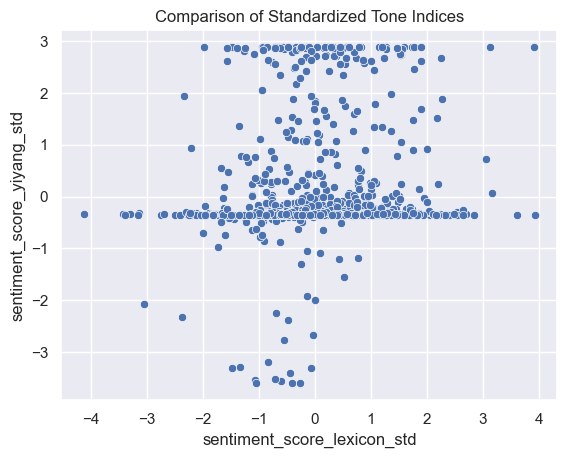

In [291]:
# Scatterplot for BoE dictionary and Finbert sentiment scores
sns.scatterplot(x='sentiment_score_lexicon_std', y='sentiment_score_yiyang_std', data=boe_speeches_sentiment)
plt.title('Comparison of Standardized Tone Indices')
plt.show()

In [293]:
# Correlation between custom dictionary and Finbert
from scipy.stats import pearsonr
corr, p_value = pearsonr(boe_speeches_sentiment['sentiment_score_custom_std'], boe_speeches_sentiment['sentiment_score_yiyang_std'])
print(f'Correlation: {corr:.2f}')

Correlation: 0.04


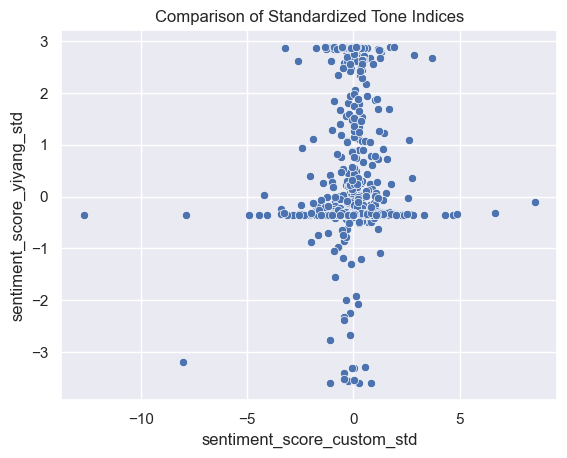

In [295]:
# Scatterplot for custom dictionary and Finbert sentiment scores
sns.scatterplot(x='sentiment_score_custom_std', y='sentiment_score_yiyang_std', data=boe_speeches_sentiment)
plt.title('Comparison of Standardized Tone Indices')
plt.show()

In [239]:
# Export the DataFrame to an Excel file
# boe_speeches_sentiment.to_excel('boe_speeches_sentiment.xlsx', index=False)

# print("DataFrame was exported successfully.")

In [297]:
# Create a new column for agreement (1 for agree, 0 for disagree)
boe_speeches_sentiment['agreement_lexicon_yiyang'] = (boe_speeches_sentiment['lexicon_label'] == boe_speeches_sentiment['yiyang_label']).astype(int)

boe_speeches_sentiment.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year_month_dt,...,sentiment_score_lexicon_std,lexicon_label,lexicon_label_percentile,sentiment_score_custom_std,custom_label,custom_label_percentile,sentiment_score_yiyang_std,yiyang_label,Gpt_sentiment,agreement_lexicon_yiyang
0,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998-09-01,...,-0.420532,Neutral,Neutral,-1.011042,Negative,Negative,1.291954,Positive,Positive,0
1,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998-10-01,...,0.815821,Neutral,Positive,-0.259869,Neutral,Neutral,-0.260091,Neutral,Positive,1
2,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998-10-01,...,-0.693424,Neutral,Neutral,-0.136018,Neutral,Neutral,-2.237069,Negative,Neutral,0
3,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998-11-01,...,-0.197920,Neutral,Neutral,-0.395969,Neutral,Negative,-0.312321,Neutral,Neutral,1
4,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998-11-01,...,-0.520744,Neutral,Neutral,-1.453032,Negative,Negative,-0.356694,Neutral,Positive,1


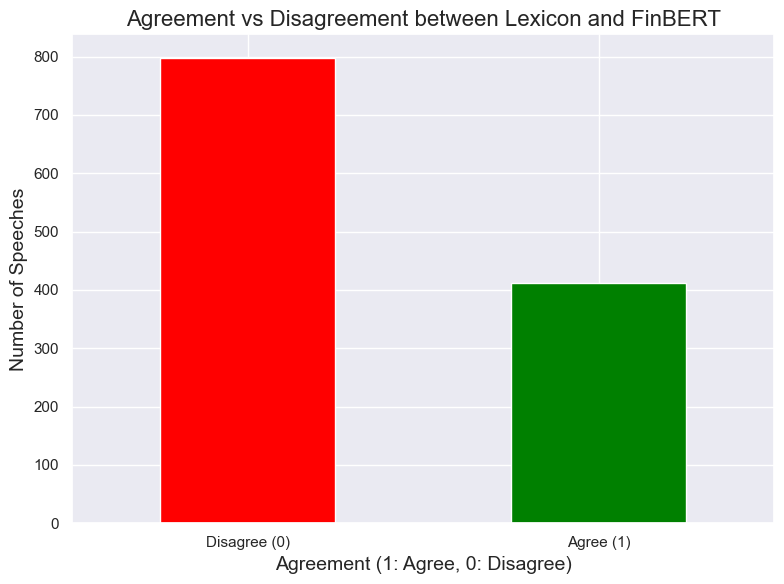

In [299]:
# Step 3: Visualize the agreement vs disagreement
agreement_count = boe_speeches_sentiment['agreement_lexicon_yiyang'].value_counts()

# Plotting
plt.figure(figsize=(8, 6))
agreement_count.plot(kind='bar', color=['red', 'green'])

# Adding labels and title
plt.title('Agreement vs Disagreement between Lexicon and FinBERT', fontsize=16)
plt.xlabel('Agreement (1: Agree, 0: Disagree)', fontsize=14)
plt.ylabel('Number of Speeches', fontsize=14)
plt.xticks([0, 1], ['Disagree (0)', 'Agree (1)'], rotation=0)
plt.tight_layout()

# Display the plot
plt.show()

In [301]:
# Create a new column for agreement (1 for agree, 0 for disagree)
boe_speeches_sentiment['agreement_custom_yiyang'] = (boe_speeches_sentiment['custom_label'] == boe_speeches_sentiment['yiyang_label']).astype(int)

boe_speeches_sentiment.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year_month_dt,...,lexicon_label,lexicon_label_percentile,sentiment_score_custom_std,custom_label,custom_label_percentile,sentiment_score_yiyang_std,yiyang_label,Gpt_sentiment,agreement_lexicon_yiyang,agreement_custom_yiyang
0,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998-09-01,...,Neutral,Neutral,-1.011042,Negative,Negative,1.291954,Positive,Positive,0,0
1,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998-10-01,...,Neutral,Positive,-0.259869,Neutral,Neutral,-0.260091,Neutral,Positive,1,1
2,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998-10-01,...,Neutral,Neutral,-0.136018,Neutral,Neutral,-2.237069,Negative,Neutral,0,0
3,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998-11-01,...,Neutral,Neutral,-0.395969,Neutral,Negative,-0.312321,Neutral,Neutral,1,1
4,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998-11-01,...,Neutral,Neutral,-1.453032,Negative,Negative,-0.356694,Neutral,Positive,1,0


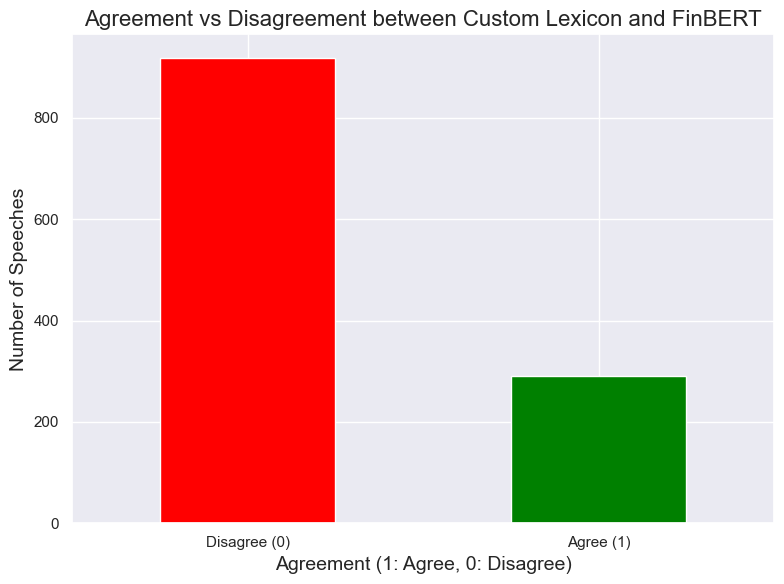

In [303]:
# Step 3: Visualize the agreement vs disagreement
agreement_count = boe_speeches_sentiment['agreement_custom_yiyang'].value_counts()

# Plotting
plt.figure(figsize=(8, 6))
agreement_count.plot(kind='bar', color=['red', 'green'])

# Adding labels and title
plt.title('Agreement vs Disagreement between Custom Lexicon and FinBERT', fontsize=16)
plt.xlabel('Agreement (1: Agree, 0: Disagree)', fontsize=14)
plt.ylabel('Number of Speeches', fontsize=14)
plt.xticks([0, 1], ['Disagree (0)', 'Agree (1)'], rotation=0)
plt.tight_layout()

# Display the plot
plt.show()

In [305]:
# Create a new column for agreement (1 for agree, 0 for disagree)
boe_speeches_sentiment['agreement_gpt_yiyang'] = (boe_speeches_sentiment['Gpt_sentiment'] == boe_speeches_sentiment['yiyang_label']).astype(int)

boe_speeches_sentiment.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year_month_dt,...,lexicon_label_percentile,sentiment_score_custom_std,custom_label,custom_label_percentile,sentiment_score_yiyang_std,yiyang_label,Gpt_sentiment,agreement_lexicon_yiyang,agreement_custom_yiyang,agreement_gpt_yiyang
0,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998-09-01,...,Neutral,-1.011042,Negative,Negative,1.291954,Positive,Positive,0,0,1
1,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998-10-01,...,Positive,-0.259869,Neutral,Neutral,-0.260091,Neutral,Positive,1,1,0
2,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998-10-01,...,Neutral,-0.136018,Neutral,Neutral,-2.237069,Negative,Neutral,0,0,0
3,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998-11-01,...,Neutral,-0.395969,Neutral,Negative,-0.312321,Neutral,Neutral,1,1,1
4,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998-11-01,...,Neutral,-1.453032,Negative,Negative,-0.356694,Neutral,Positive,1,0,0


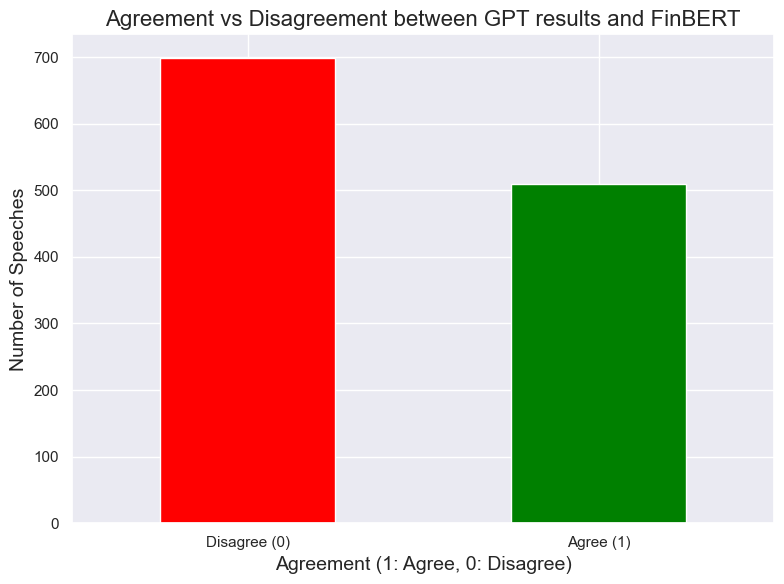

In [307]:
# Step 3: Visualize the agreement vs disagreement
agreement_count = boe_speeches_sentiment['agreement_gpt_yiyang'].value_counts()

# Plotting
plt.figure(figsize=(8, 6))
agreement_count.plot(kind='bar', color=['red', 'green'])

# Adding labels and title
plt.title('Agreement vs Disagreement between GPT results and FinBERT', fontsize=16)
plt.xlabel('Agreement (1: Agree, 0: Disagree)', fontsize=14)
plt.ylabel('Number of Speeches', fontsize=14)
plt.xticks([0, 1], ['Disagree (0)', 'Agree (1)'], rotation=0)
plt.tight_layout()

# Display the plot
plt.show()

**Accuracy Test**

In [ ]:
# Randomly sample 5 reviews from the DataFrame.
# accuracy_test = boe_speeches_sentiment.sample(n=5, random_state=101)

# Extract only the original review and summary columns.
# accuracy_test = accuracy_test[['year_month','text', 'lexicon_label', 'yiyang_label', 'gpt_sentiment']]

# Add columns for manually labelling the sentiment.
# accuracy_test['sentiment_labelled'] = ''

# Display the sampled reviews.
# accuracy_test

In [ ]:
# Extract a CSV file.
#  accuracy_test.to_csv('sentiment_accuracy_test.csv', index = True)

# print("DataFrame was exported successfully.")

## 4. Display the data

In [367]:
boe_speeches_sentiment.dtypes

reference                              object
country                                object
date                           datetime64[ns]
title                                  object
author                                 object
is_gov                                  int64
text                                   object
date_format                    datetime64[ns]
year_month                          period[M]
year_month_dt                  datetime64[ns]
year                                    int32
text_lemmatised                        object
text_lemmatised_str                    object
word_count                              int64
sentiment_score_lexicon_std           float64
lexicon_label                          object
lexicon_label_percentile               object
sentiment_score_custom_std            float64
custom_label                           object
custom_label_percentile                object
sentiment_score_yiyang_std            float64
yiyang_label                      

**Filter for 2012 to 2022**

In [337]:
# Filter the data for 2012 to 2022
start_date = '2012-01'
end_date = '2022-12'

In [343]:
# Filter the data for specified period
boe_speeches_sentiment_12_22 = boe_speeches_sentiment[(boe_speeches_sentiment['year_month'] >= start_date) & (boe_speeches_sentiment['year_month'] <= end_date)]

# View the DataFrame
boe_speeches_sentiment_12_22

,reference,country,date,title,author,is_gov,text,date_format,year_month,year_month_dt,...,lexicon_label_percentile,sentiment_score_custom_std,custom_label,custom_label_percentile,sentiment_score_yiyang_std,yiyang_label,Gpt_sentiment,agreement_lexicon_yiyang,agreement_custom_yiyang,agreement_gpt_yiyang
488,r120117a_BOE,united kingdom,2012-01-17,What the return of 19th century economics mean...,posen,0,I am very pleased to have the opportunity to s...,2012-01-17,2012-01,2012-01-01,...,Neutral,-0.550444,Neutral,Negative,2.880930,Positive,Positive,0,0,1
489,r120119a_BOE,united kingdom,2012-01-19,Accounting for bank uncertainty,haldane,0,Fair value accounting principles are under att...,2012-01-19,2012-01,2012-01-01,...,Neutral,-2.319507,Negative,Negative,-0.351808,Neutral,Positive,1,0,0
490,r120124a_BOE,united kingdom,2012-01-24,Speech,king,1,As we head into a challenging year for the wor...,2012-01-24,2012-01,2012-01-01,...,Negative,-0.126203,Neutral,Neutral,2.885036,Positive,Negative,0,0,0
491,r120126a_BOE,united kingdom,2012-01-26,Towards a new architecture for payment arrange...,salmon,0,It is a pleasure to participate in this annual...,2012-01-26,2012-01,2012-01-01,...,Neutral,0.607043,Neutral,Positive,-0.346173,Neutral,Neutral,1,1,1
492,r120201a_BOE,united kingdom,2012-02-01,Introductory remarks at the book launch for ‘I...,tucker,0,"The contributions come from journalism, politi...",2012-02-01,2012-02,2012-02-01,...,Neutral,0.025941,Neutral,Neutral,-0.358860,Neutral,Positive,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1204,r221007a_BOE,united kingdom,2022-10-07,"Shocks, inflation, and the policy response",ramsden,0,Thank you very much for the invitation to spea...,2022-10-07,2022-10,2022-10-01,...,Neutral,-0.061300,Neutral,Neutral,-0.354186,Neutral,Negative,1,1,0
1205,r221012a_BOE,united kingdom,2022-10-12,Monetary policy: an anchor in challenging times,pill,0,Huw Pill talks about how we will bring inflati...,2022-10-12,2022-10,2022-10-01,...,Neutral,-0.275152,Neutral,Neutral,-0.349381,Neutral,Positive,1,1,0
1206,r221015a_BOE,united kingdom,2022-10-15,Monetary policy and financial stability interv...,bailey,1,We are meeting in the most difficult of times....,2022-10-15,2022-10,2022-10-01,...,Negative,0.245666,Neutral,Neutral,-0.480488,Neutral,Neutral,0,1,1
1207,r221019a_BOE,united kingdom,2022-10-19,"Governance of “Decentralised” Finance: Get up,...",wilkins,0,"These are divided into seven categories, suffr...",2022-10-19,2022-10,2022-10-01,...,Positive,0.025941,Neutral,Neutral,-0.338031,Neutral,Neutral,0,1,1


### Speech Statistics

**Word Count per Year**

In [390]:
# Group and aggregate sentiment scores by month
wordcount_monthly = boe_speeches_sentiment_12_22.groupby('year_month_dt')['word_count'].mean().reset_index()

# View the DataFrame
wordcount_monthly.head()

,year_month_dt,word_count
0,2012-01-01,1714.250
1,2012-02-01,2275.600
2,2012-03-01,1770.250
3,2012-04-01,2163.000
4,2012-05-01,1678.375


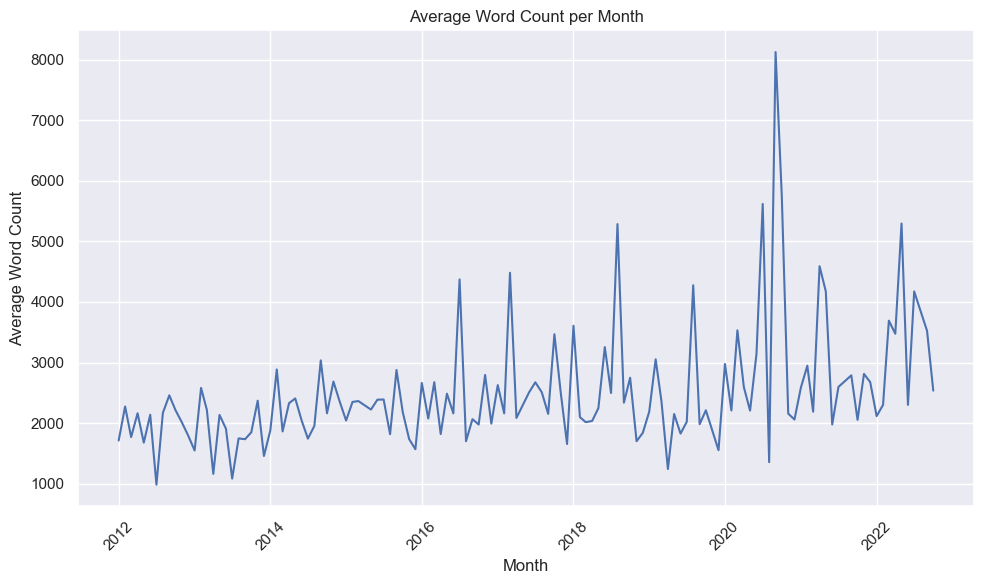

In [394]:
# Plot a line chart of average word count per month
plt.figure(figsize=(10, 6))
plt.plot(wordcount_monthly['year_month_dt'], wordcount_monthly['word_count'])
plt.xlabel('Month')
plt.ylabel('Average Word Count')
plt.title('Average Word Count per Month')
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.show()

In [392]:
# Group and aggregate sentiment scores by year
wordcount_yearly = boe_speeches_sentiment_12_22.groupby('year')['word_count'].mean().reset_index()

# View the DataFrame
wordcount_yearly.head()

,year,word_count
0,2012,2002.661538
1,2013,1848.116667
2,2014,2236.535211
3,2015,2240.148148
4,2016,2365.552632


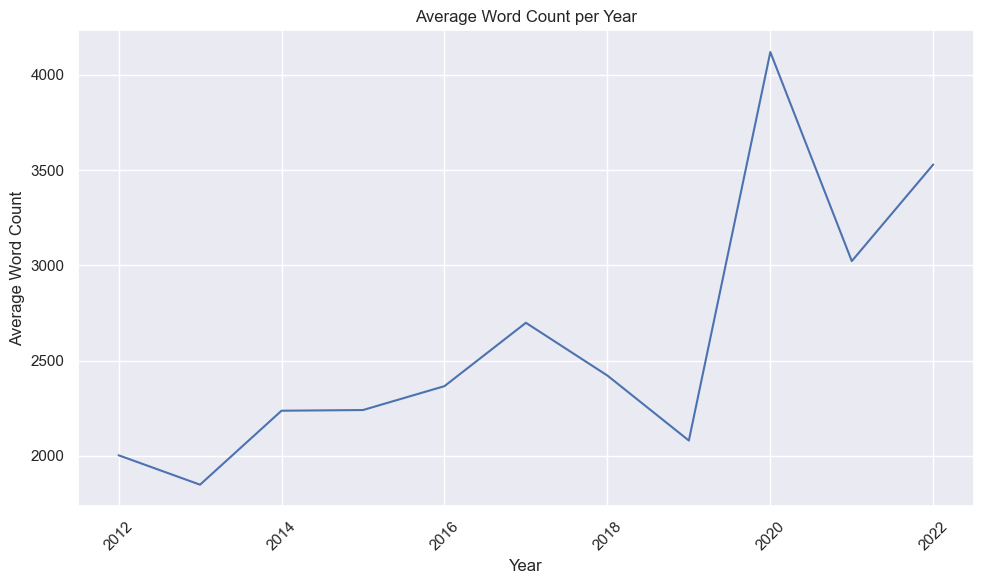

In [398]:
# Plot a line chart of average word count per year
plt.figure(figsize=(10, 6))
plt.plot(wordcount_yearly['year'], wordcount_yearly['word_count'])
plt.xlabel('Year')
plt.ylabel('Average Word Count')
plt.title('Average Word Count per Year')
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.show()

In [422]:
# Group and aggregate sentiment scores by year
wordcount_count_yearly = boe_speeches_sentiment_12_22.groupby('year').agg({'word_count': 'mean',
                                                                           'reference': 'count'
                                                                          }).reset_index().rename(columns={'reference': 'speech_count'})

# View the DataFrame
wordcount_count_yearly.head()

,year,word_count,speech_count
0,2012,2002.661538,65
1,2013,1848.116667,60
2,2014,2236.535211,71
3,2015,2240.148148,81
4,2016,2365.552632,76


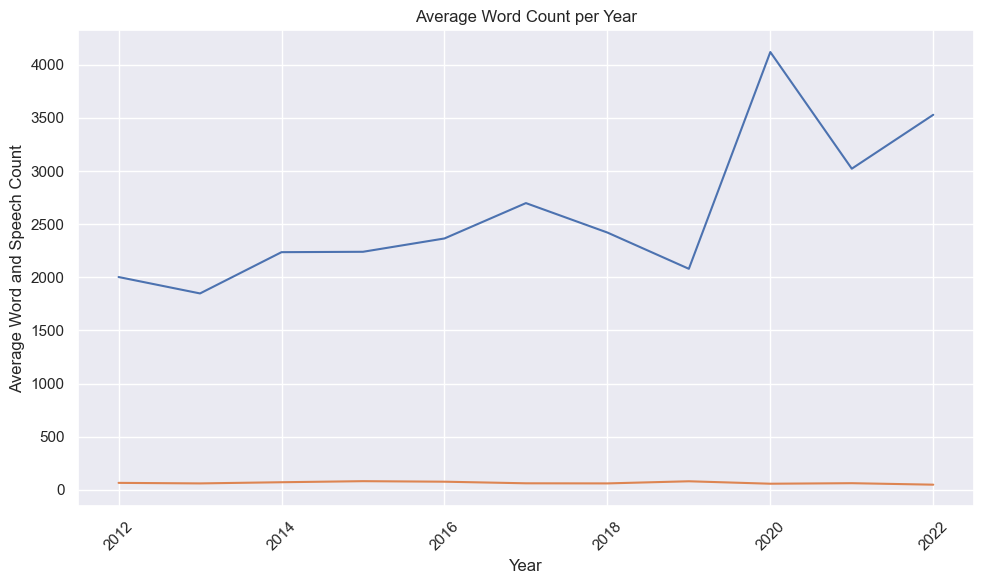

In [428]:
# Plot a line chart of average word count and number of speeches per year
plt.figure(figsize=(10, 6))
plt.plot(wordcount_count_yearly['year'], wordcount_count_yearly[['word_count', 'speech_count']])
plt.xlabel('Year')
plt.ylabel('Average Word and Speech Count')
plt.title('Average Word Count per Year')
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.show()

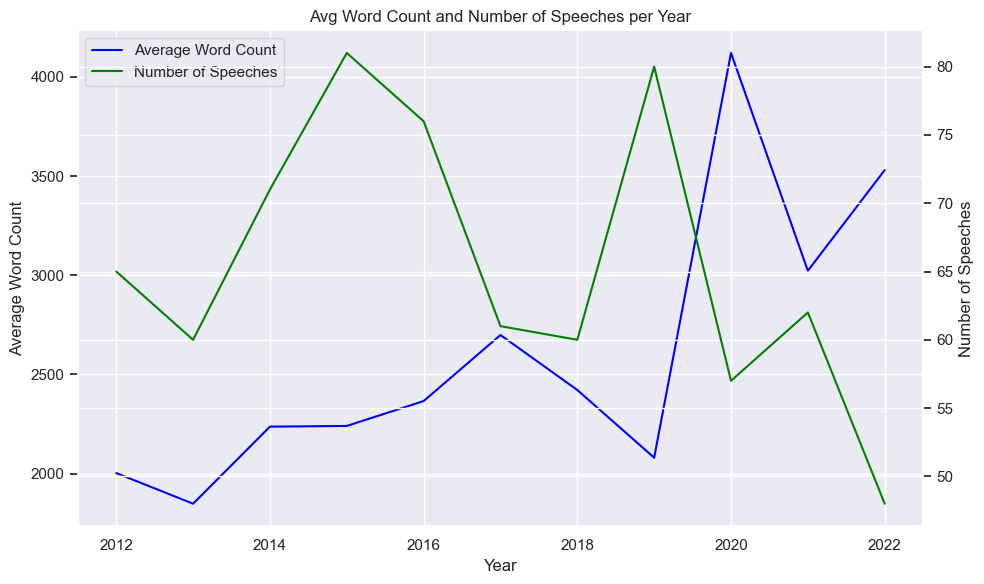

In [440]:
# Create the main plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot 'word_count' on the primary y-axis
ax1.plot(wordcount_count_yearly['year'], wordcount_count_yearly['word_count'], color='blue', label='Average Word Count')
ax1.set_xlabel('Year')
ax1.set_ylabel('Average Word Count')
ax1.tick_params(axis='y')

# Create a secondary y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot 'speech_count' on the secondary y-axis
ax2.plot(wordcount_count_yearly['year'], wordcount_count_yearly['speech_count'], color='green', label='Number of Speeches')
ax2.set_ylabel('Number of Speeches')
ax2.tick_params(axis='y')

# Add titles and grid if needed
plt.title('Avg Word Count and Number of Speeches per Year')

# Optionally, add a legend
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper left')

# Display the plot
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Number of Speeches per Year**

In [400]:
# Group and aggregate number of speeches by governor by year
governor_speeches_monthly = boe_speeches_sentiment_12_22.groupby(['year', 'is_gov']).size().reset_index(name='count')

# View the DataFrame
governor_speeches_monthly.head()

,year,is_gov,count
0,2012,0,57
1,2012,1,8
2,2013,0,48
3,2013,1,12
4,2014,0,61


In [402]:
# Pivot the data for plotting
governor_speeches_monthly_pivot = governor_speeches_monthly.pivot(index='year', columns='is_gov', values='count').fillna(0)

# View the DataFrame
governor_speeches_monthly_pivot.head()

is_gov,0,1
year,,
2012,57,8
2013,48,12
2014,61,10
2015,65,16
2016,62,14


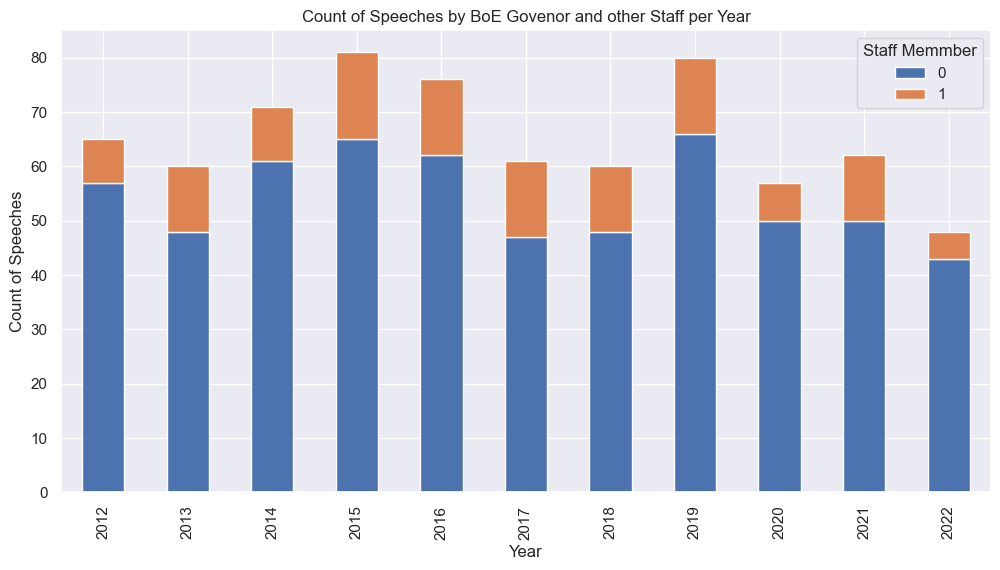

In [416]:
# Plot a bar chart per month
ax = governor_speeches_monthly_pivot.plot(kind='bar', stacked=True, figsize=(12, 6))

# Customize plot
ax.set_xlabel('Year')
ax.set_ylabel('Count of Speeches')
ax.set_title('Count of Speeches by BoE Govenor and other Staff per Year')
ax.legend(title='Staff Memmber')

# Display the plot
plt.show()

In [351]:
# Group and aggregate sentiment scores by year
gpt_sentiment_monthly = boe_speeches_sentiment_12_22.groupby(['year', 'Gpt_sentiment']).size().reset_index(name='count')

# View the DataFrame
gpt_sentiment_monthly.head()

,year,Gpt_sentiment,count
0,2012,Negative,14
1,2012,Neutral,29
2,2012,Positive,22
3,2013,Negative,2
4,2013,Neutral,26


In [355]:
# Pivot the data for plotting
gpt_sentiment_monthly_pivot = gpt_sentiment_monthly.pivot(index='year', columns='Gpt_sentiment', values='count').fillna(0)

# View the DataFrame
gpt_sentiment_monthly_pivot.head()

Gpt_sentiment,Negative,Neutral,Positive
year,,,
2012,14.0,29.0,22.0
2013,2.0,26.0,32.0
2014,5.0,21.0,45.0
2015,3.0,39.0,39.0
2016,3.0,24.0,49.0


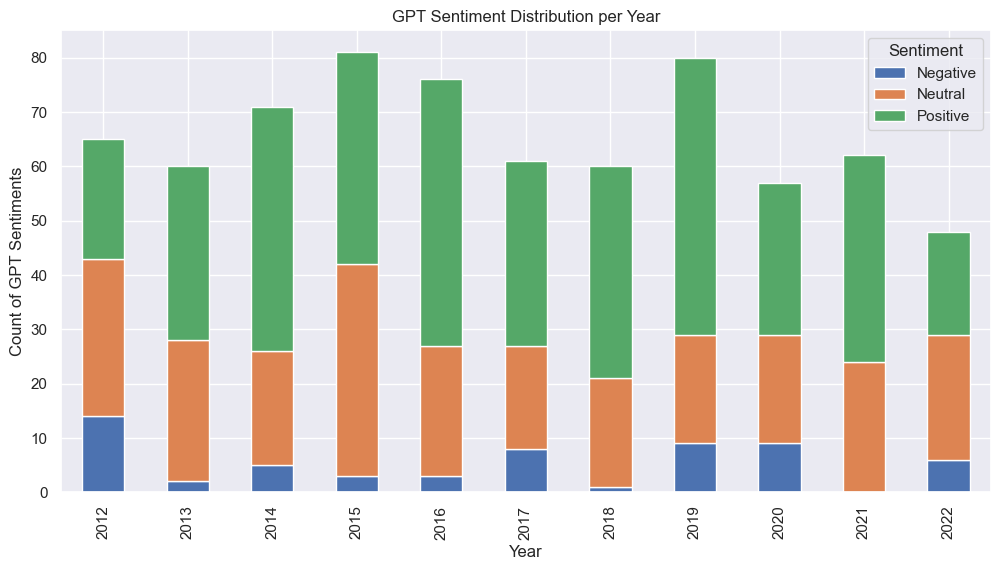

In [359]:
# Plot a bar chart per month
ax = gpt_sentiment_monthly_pivot.plot(kind='bar', stacked=True, figsize=(12, 6))

# Customize plot
ax.set_xlabel('Year')
ax.set_ylabel('Count of GPT Sentiments')
ax.set_title('GPT Sentiment Distribution per Year')
ax.legend(title='Sentiment')

# Display the plot
plt.show()

### 4.1. Compare the sentiment scores over time

In [269]:
# Group and aggregate sentiment scores by month
sentiment_monthly = boe_speeches_sentiment.groupby('year_month_dt')[['sentiment_score_yiyang_std','sentiment_score_lexicon_std', \
                                    'sentiment_score_custom_std']].mean().reset_index()
# View the DataFrame
sentiment_monthly.head()

,year_month_dt,sentiment_score_yiyang_std,sentiment_score_lexicon_std,sentiment_score_custom_std
0,1998-09-01,1.291954,-0.420532,-1.011042
1,1998-10-01,-1.248580,0.061198,-0.197944
2,1998-11-01,-0.341816,-0.480369,-1.291942
3,1998-12-01,-0.356963,-0.747103,-0.166944
4,1999-01-01,-0.601166,-0.357277,-0.366383


In [271]:
# Review the DataFrame
sentiment_monthly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 272 entries, 0 to 271
Data columns (total 4 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   year_month_dt                272 non-null    datetime64[ns]
 1   sentiment_score_yiyang_std   272 non-null    float64       
 2   sentiment_score_lexicon_std  272 non-null    float64       
 3   sentiment_score_custom_std   272 non-null    float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 8.6 KB


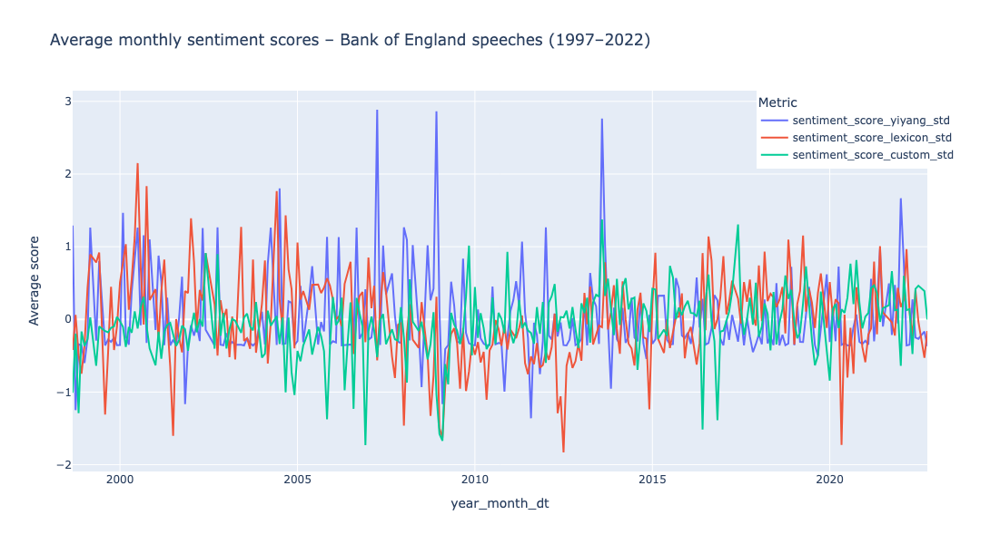

In [275]:
# Plot sentiment scores over time

# Define the plot
fig = px.line(
     sentiment_monthly,
     x='year_month_dt',
     y=['sentiment_score_yiyang_std','sentiment_score_lexicon_std', 'sentiment_score_custom_std'],
     title="Average monthly sentiment scores – Bank of England speeches (1997–2022)",
     labels={'value': 'Average score', 'variable': 'Metric'}
)

# Adjust size
fig.update_layout(width=1100, height=600)

# Move the legend
fig.update_layout(
    legend=dict(
        x=0.8,
        y=1,
        xanchor='left',
        yanchor='top'
    )
)

# Display the plot
fig.show()

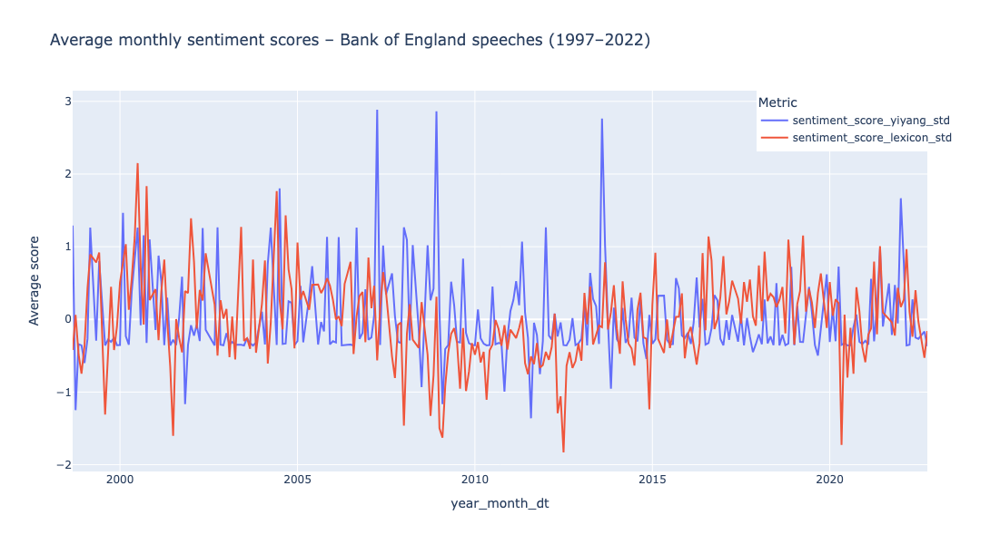

In [277]:
# Plot sentiment scores over time

# Define the plot
fig = px.line(
     sentiment_monthly,
     x='year_month_dt',
     y=['sentiment_score_yiyang_std','sentiment_score_lexicon_std'],
     title="Average monthly sentiment scores – Bank of England speeches (1997–2022)",
     labels={'value': 'Average score', 'variable': 'Metric'}
)

# Adjust size
fig.update_layout(width=1100, height=600)

# Move the legend
fig.update_layout(
    legend=dict(
        x=0.8,
        y=1,
        xanchor='left',
        yanchor='top'
    )
)

# Display the plot
fig.show()

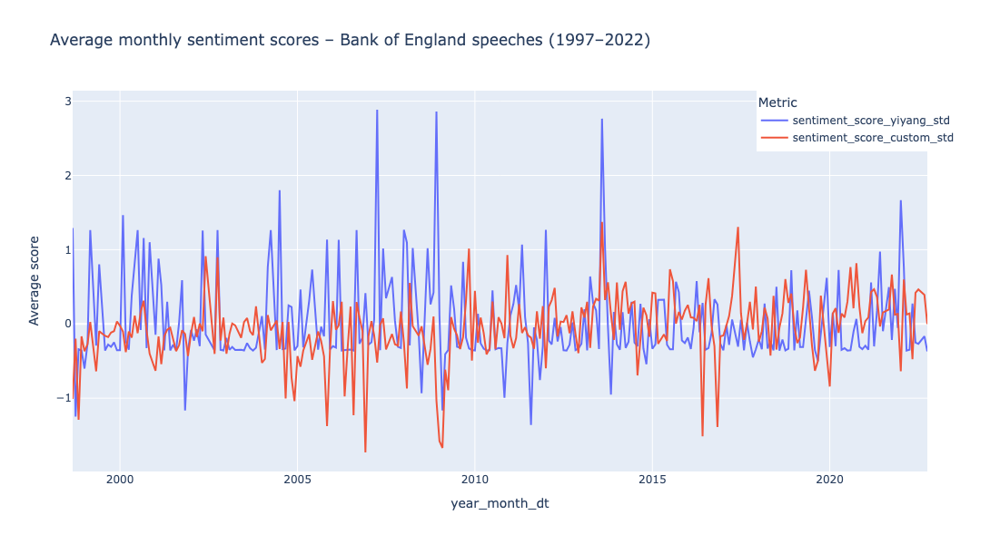

In [281]:
# Plot sentiment scores over time

# Define the plot
fig = px.line(
     sentiment_monthly,
     x='year_month_dt',
     y=['sentiment_score_yiyang_std','sentiment_score_custom_std'],
     title="Average monthly sentiment scores – Bank of England speeches (1997–2022)",
     labels={'value': 'Average score', 'variable': 'Metric'}
)

# Adjust size
fig.update_layout(width=1100, height=600)

# Move the legend
fig.update_layout(
    legend=dict(
        x=0.8,
        y=1,
        xanchor='left',
        yanchor='top'
    )
)

# Display the plot
fig.show()

### 4.2. Finbert analysis

In [442]:
# View the columns to include
boe_speeches.columns

Index(['reference', 'country', 'date', 'title', 'author', 'is_gov', 'text',
       'date_format', 'year_month', 'year', 'year_month_dt', 'text_cleaned',
       'text_tokenised', 'text_lemmatised', 'text_lemmatised_str',
       'word_count', 'Negative', 'Positive', 'Uncertainty', 'Litigious',
       'Strong', 'Weak', 'Constraining', 'sentiment_score_lexicon',
       'sentiment_score_lexicon_std', 'lexicon_label',
       'lexicon_label_percentile', 'negative_custom', 'positive_custom',
       'uncertainty_custom', 'sentiment_score_custom',
       'sentiment_score_custom_std', 'custom_label', 'custom_label_percentile',
       'yiyang_probs', 'yiyang_neutral', 'yiyang_positive', 'yiyang_negative',
       'yiyang_label', 'yiyang_confidence', 'sentiment_score_yiyang',
       'sentiment_score_yiyang_std'],
      dtype='object')

In [446]:
# Create a new DataFrame with all sentiment scores to include for comparison.
boe_speeches_finbert = boe_speeches[['reference', 'country', 'date', 'title', 'author', 'is_gov', 'text',
                                     'date_format', 'year_month', 'year_month_dt', 'year', 'text_lemmatised', 'text_lemmatised_str',
                                     'word_count', 'yiyang_probs', 'yiyang_neutral', 'yiyang_positive', 'yiyang_negative',
                                     'yiyang_label', 'yiyang_confidence', 'sentiment_score_yiyang',
                                     'sentiment_score_yiyang_std']]

# View the DataFrame.
boe_speeches_finbert.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year_month_dt,...,text_lemmatised_str,word_count,yiyang_probs,yiyang_neutral,yiyang_positive,yiyang_negative,yiyang_label,yiyang_confidence,sentiment_score_yiyang,sentiment_score_yiyang_std
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998-09-01,...,thank chairman actually pleased opportunity re...,1162,"[0.4900095, 0.5094528, 0.00053772976]",0.490009,0.509453,0.000538,Positive,0.509453,0.508915,1.291954
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998-10-01,...,great pleasure beautiful city bruges honour op...,2108,"[0.969261, 0.030696781, 4.2198746e-05]",0.969261,0.030697,0.000042,Neutral,0.969261,0.030655,-0.260091
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998-10-01,...,industry suffer volatility british economy pas...,1240,"[0.37933072, 0.021060491, 0.5996088]",0.379331,0.021060,0.599609,Negative,0.599609,-0.578548,-2.237069
4964,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998-11-01,...,topic evening use forecast economic policy mak...,2380,"[0.9847193, 0.0149205, 0.00036025542]",0.984719,0.014921,0.000360,Neutral,0.984719,0.014560,-0.312321
4965,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998-11-01,...,six year ago week sterling leave exchange rate...,2580,"[0.9990752, 0.0009056315, 1.9160354e-05]",0.999075,0.000906,0.000019,Neutral,0.999075,0.000886,-0.356694


In [448]:
# Group and aggregate sentiment scores by month
finbert_monthly = boe_speeches_finbert.groupby('year_month')[['yiyang_neutral', 'yiyang_positive', 'yiyang_negative', \
                                                              'yiyang_confidence', 'sentiment_score_yiyang', \
                                                                 'sentiment_score_yiyang_std']].mean().reset_index()
finbert_monthly.head()

,year_month,yiyang_neutral,yiyang_positive,yiyang_negative,yiyang_confidence,sentiment_score_yiyang,sentiment_score_yiyang_std
0,1998-09,0.490009,0.509453,0.000538,0.509453,0.508915,1.291954
1,1998-10,0.674296,0.025879,0.299825,0.784435,-0.273947,-1.248580
2,1998-11,0.993288,0.006092,0.000620,0.993288,0.005471,-0.341816
3,1998-12,0.999072,0.000866,0.000062,0.999072,0.000804,-0.356963
4,1999-01,0.891927,0.016813,0.091260,0.891927,-0.074447,-0.601166


In [454]:
# Extract a CSV file.
# finbert_monthly.to_csv('boe_speeches_finbert_monthly.csv', index = True)

# print("DataFrame was exported successfully.")

In [456]:
# Change the date format
finbert_monthly['year_month_dt'] = finbert_monthly['year_month'].dt.to_timestamp()

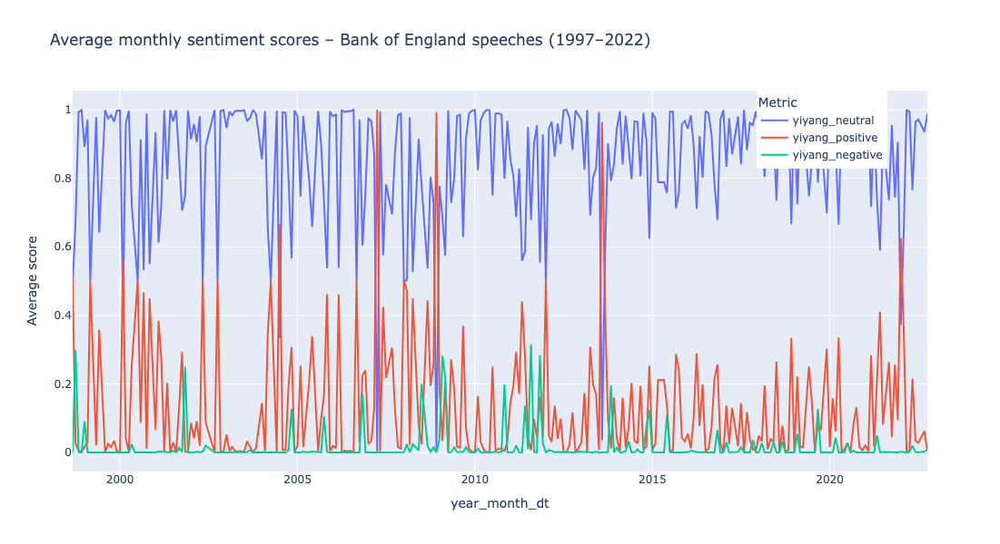

In [458]:
# Plot the data over the full time period
fig = px.line(
     finbert_monthly,
     x='year_month_dt',
     y=['yiyang_neutral','yiyang_positive', 'yiyang_negative'],
     title="Average monthly sentiment scores – Bank of England speeches (1997–2022)",
     labels={'value': 'Average score', 'variable': 'Metric'}
)

# Adjust size
fig.update_layout(width=1100, height=600)

# Move the legend
fig.update_layout(
    legend=dict(
        x=0.8,
        y=1,
        xanchor='left',
        yanchor='top'
    )
)

# Show the figure
fig.show()

In [460]:
# Copy the DataFrame
seasonality_finbert = finbert_monthly.copy()

seasonality_finbert

,year_month,yiyang_neutral,yiyang_positive,yiyang_negative,yiyang_confidence,sentiment_score_yiyang,sentiment_score_yiyang_std,year_month_dt
0,1998-09,0.490009,0.509453,0.000538,0.509453,0.508915,1.291954,1998-09-01
1,1998-10,0.674296,0.025879,0.299825,0.784435,-0.273947,-1.248580,1998-10-01
2,1998-11,0.993288,0.006092,0.000620,0.993288,0.005471,-0.341816,1998-11-01
3,1998-12,0.999072,0.000866,0.000062,0.999072,0.000804,-0.356963,1998-12-01
4,1999-01,0.891927,0.016813,0.091260,0.891927,-0.074447,-0.601166,1999-01-01
...,...,...,...,...,...,...,...,...
267,2022-05,0.765428,0.215132,0.019440,0.908033,0.195692,0.275485,2022-05-01
268,2022-06,0.965101,0.034119,0.000780,0.965101,0.033339,-0.251380,2022-06-01
269,2022-07,0.971315,0.028482,0.000203,0.971315,0.028278,-0.267802,2022-07-01
270,2022-09,0.935309,0.062070,0.002621,0.935309,0.059449,-0.166647,2022-09-01


In [462]:
# Filter the data by date for Covid
start_date = '2012-01'
end_date = '2022-12'

In [464]:
# Filter the data for specified period
seasonality_finbert_10 = seasonality_finbert[(seasonality_finbert['year_month'] >= start_date) & (seasonality_finbert['year_month'] <= end_date)]

In [466]:
# Set the datetime as index
seasonality_finbert_10.set_index('year_month_dt', inplace=True)

# View the DataFrame
seasonality_finbert_10

,year_month,yiyang_neutral,yiyang_positive,yiyang_negative,yiyang_confidence,sentiment_score_yiyang,sentiment_score_yiyang_std
year_month_dt,,,,,,,
2012-01-01,2012-01,0.498525,0.501350,0.000125,0.997744,0.501224,1.266996
2012-02-01,2012-02,0.944208,0.049008,0.006784,0.944208,0.042224,-0.222546
2012-03-01,2012-03,0.964541,0.030667,0.004791,0.964541,0.025876,-0.275599
2012-04-01,2012-04,0.863628,0.135903,0.000468,0.863628,0.135435,0.079940
2012-05-01,2012-05,0.959425,0.039428,0.001147,0.959425,0.038281,-0.235342
...,...,...,...,...,...,...,...
2022-05-01,2022-05,0.765428,0.215132,0.019440,0.908033,0.195692,0.275485
2022-06-01,2022-06,0.965101,0.034119,0.000780,0.965101,0.033339,-0.251380
2022-07-01,2022-07,0.971315,0.028482,0.000203,0.971315,0.028278,-0.267802


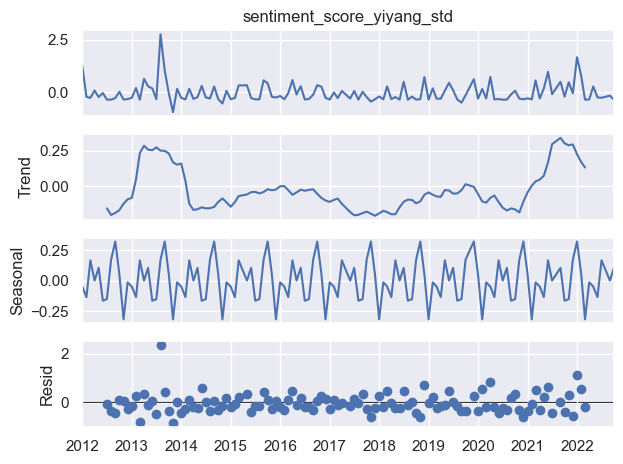

In [468]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Perform decomposition
decomposed = seasonal_decompose(seasonality_finbert_10['sentiment_score_yiyang_std'], model='additive', period=12)

# Plot the decomposition
decomposed.plot()
plt.show()

**Observations Peaks**
- August 2013: Peak with a speech announcing Jane Austen on 10 GBP note and a discussion of the evolution of monetary policy since 2008-2009 crisis
- January 2022: speech about inflation with a sense of urgency about controlling inflation with reassurance that the Bank is actively monitoring and prepared to act responsibly. 

## Governor speeches only

In [470]:
# Filter speeches for governors only
boe_speeches_finbert_gov = boe_speeches_finbert[boe_speeches_finbert['is_gov'] == 1]

# View the DataFrame
boe_speeches_finbert_gov.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year_month_dt,...,text_lemmatised_str,word_count,yiyang_probs,yiyang_neutral,yiyang_positive,yiyang_negative,yiyang_label,yiyang_confidence,sentiment_score_yiyang,sentiment_score_yiyang_std
4961,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998-09-01,...,thank chairman actually pleased opportunity re...,1162,"[0.4900095, 0.5094528, 0.00053772976]",0.490009,0.509453,0.000538,Positive,0.509453,0.508915,1.291954
4962,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998-10-01,...,great pleasure beautiful city bruges honour op...,2108,"[0.969261, 0.030696781, 4.2198746e-05]",0.969261,0.030697,0.000042,Neutral,0.969261,0.030655,-0.260091
4963,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998-10-01,...,industry suffer volatility british economy pas...,1240,"[0.37933072, 0.021060491, 0.5996088]",0.379331,0.021060,0.599609,Negative,0.599609,-0.578548,-2.237069
4966,r981119a_BOE,united kingdom,1998-11-19,Speech,george,1,Let me put some of the recent newspaper headli...,1998-11-19,1998-11,1998-11-01,...,let put recent newspaper headline alongside fa...,1174,"[0.99606884, 0.002449211, 0.0014819275]",0.996069,0.002449,0.001482,Neutral,0.996069,0.000967,-0.356432
4969,r990112a_BOE,united kingdom,1999-01-12,Speech,george,1,I am only too well aware of the pressure curre...,1999-01-12,1999-01,1999-01-01,...,well aware pressure currently face large part ...,1304,"[0.78577423, 0.031724565, 0.1825012]",0.785774,0.031725,0.182501,Neutral,0.785774,-0.150777,-0.848870


In [472]:
# Review the DataFrame
boe_speeches_finbert_gov.info()

<class 'pandas.core.frame.DataFrame'>
Index: 245 entries, 4961 to 6167
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   reference                   245 non-null    object        
 1   country                     245 non-null    object        
 2   date                        245 non-null    datetime64[ns]
 3   title                       245 non-null    object        
 4   author                      245 non-null    object        
 5   is_gov                      245 non-null    int64         
 6   text                        245 non-null    object        
 7   date_format                 245 non-null    datetime64[ns]
 8   year_month                  245 non-null    period[M]     
 9   year_month_dt               245 non-null    datetime64[ns]
 10  year                        245 non-null    int32         
 11  text_lemmatised             245 non-null    object        


In [474]:
# Group and aggregate sentiment scores by month
finbert_monthly_gov = boe_speeches_finbert_gov.groupby('year_month')[['yiyang_neutral', 'yiyang_positive', 'yiyang_negative', \
                                                              'yiyang_confidence', 'sentiment_score_yiyang', \
                                                                 'sentiment_score_yiyang_std']].mean().reset_index()
finbert_monthly_gov.head()

,year_month,yiyang_neutral,yiyang_positive,yiyang_negative,yiyang_confidence,sentiment_score_yiyang,sentiment_score_yiyang_std
0,1998-09,0.490009,0.509453,0.000538,0.509453,0.508915,1.291954
1,1998-10,0.674296,0.025879,0.299825,0.784435,-0.273947,-1.248580
2,1998-11,0.996069,0.002449,0.001482,0.996069,0.000967,-0.356432
3,1999-01,0.891927,0.016813,0.091260,0.891927,-0.074447,-0.601166
4,1999-02,0.971069,0.028773,0.000158,0.971069,0.028615,-0.266709


In [476]:
# Change the date format
finbert_monthly_gov['year_month_dt'] = finbert_monthly_gov['year_month'].dt.to_timestamp()

In [478]:
# Filter the data for 10 years
start_date = '2012-01'
end_date = '2022-12'

In [480]:
# Filter the data for specified period
seasonality_finbert_gov_10 = finbert_monthly_gov[(finbert_monthly_gov['year_month'] >= start_date) & \
                          (finbert_monthly_gov['year_month'] <= end_date)]

In [482]:
# Set the datetime as index
seasonality_finbert_gov_10.set_index('year_month_dt', inplace=True)

# View the DataFrame
seasonality_finbert_gov_10

,year_month,yiyang_neutral,yiyang_positive,yiyang_negative,yiyang_confidence,sentiment_score_yiyang,sentiment_score_yiyang_std
year_month_dt,,,,,,,
2012-01-01,2012-01,0.000102,0.999860,0.000039,0.999860,0.999821,2.885036
2012-03-01,2012-03,0.999775,0.000209,0.000016,0.999775,0.000193,-0.358946
2012-05-01,2012-05,0.990324,0.006584,0.003092,0.990324,0.003491,-0.348241
2012-10-01,2012-10,0.993951,0.006027,0.000023,0.993951,0.006004,-0.340087
2012-11-01,2012-11,0.996141,0.003737,0.000122,0.996141,0.003615,-0.347839
...,...,...,...,...,...,...,...
2021-11-01,2021-11,0.978894,0.020708,0.000398,0.978894,0.020310,-0.293662
2022-02-01,2022-02,0.066833,0.932992,0.000175,0.932992,0.932817,2.667595
2022-05-01,2022-05,0.860221,0.011863,0.127916,0.860221,-0.116053,-0.736185


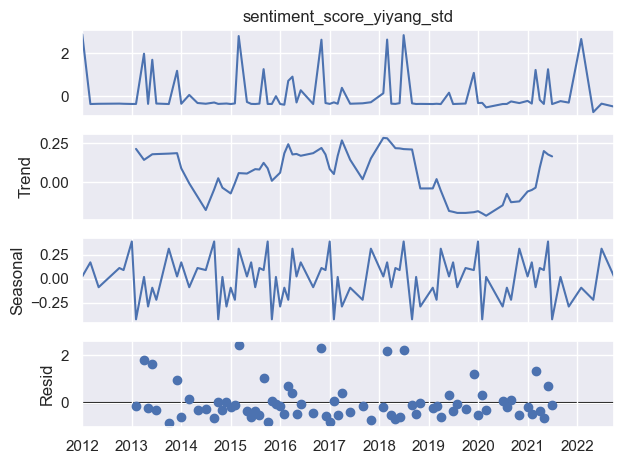

In [484]:
# Perform decomposition
decomposed = seasonal_decompose(seasonality_finbert_gov_10['sentiment_score_yiyang_std'], model='additive', period=12)

# Plot the decomposition
decomposed.plot()
plt.show()

### 4.1. Covid

In [486]:
# Filter the data by date for Covid
start_date = '2020-01'
end_date = '2022-12'

In [488]:
# Filter the data for specified period
finbert_covid = finbert_monthly[(finbert_monthly['year_month_dt'] >= start_date) & (finbert_monthly['year_month_dt'] <= end_date)]

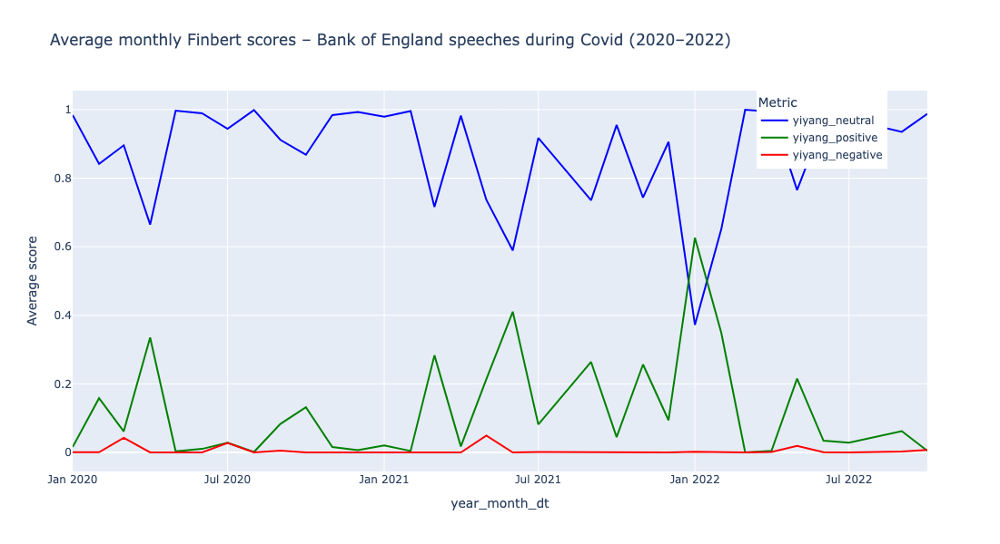

In [490]:
fig = px.line(
     finbert_covid,
     x='year_month_dt',
     y=['yiyang_neutral','yiyang_positive', 'yiyang_negative'],
     title='Average monthly Finbert scores – Bank of England speeches during Covid (2020–2022)',
     labels={'value': 'Average score', 'variable': 'Metric'},
    color_discrete_sequence=['blue', 'green', 'red']
)

# Adjust size
fig.update_layout(width=1100, height=600)

# Move the legend
fig.update_layout(
    legend=dict(
        x=0.8,
        y=1,
        xanchor='left',
        yanchor='top'
    )
)

# Show the figure
fig.show()

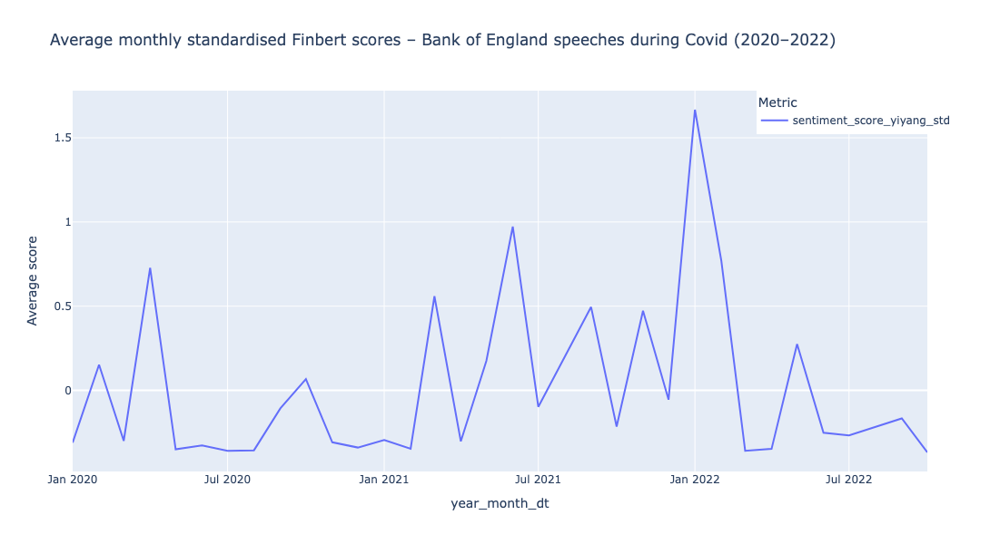

In [492]:
fig = px.line(
     finbert_covid,
     x='year_month_dt',
     y=['sentiment_score_yiyang_std'],
     title='Average monthly standardised Finbert scores – Bank of England speeches during Covid (2020–2022)',
     labels={'value': 'Average score', 'variable': 'Metric'}
)

# Adjust size
fig.update_layout(width=1100, height=600)

# Move the legend
fig.update_layout(
    legend=dict(
        x=0.8,
        y=1,
        xanchor='left',
        yanchor='top'
    )
)

# Show the figure
fig.show()

In [494]:
# Filter the data for specified period
finbert_gov_covid = finbert_monthly_gov[(finbert_monthly_gov['year_month_dt'] >= start_date) & (finbert_monthly_gov['year_month_dt'] <= end_date)]

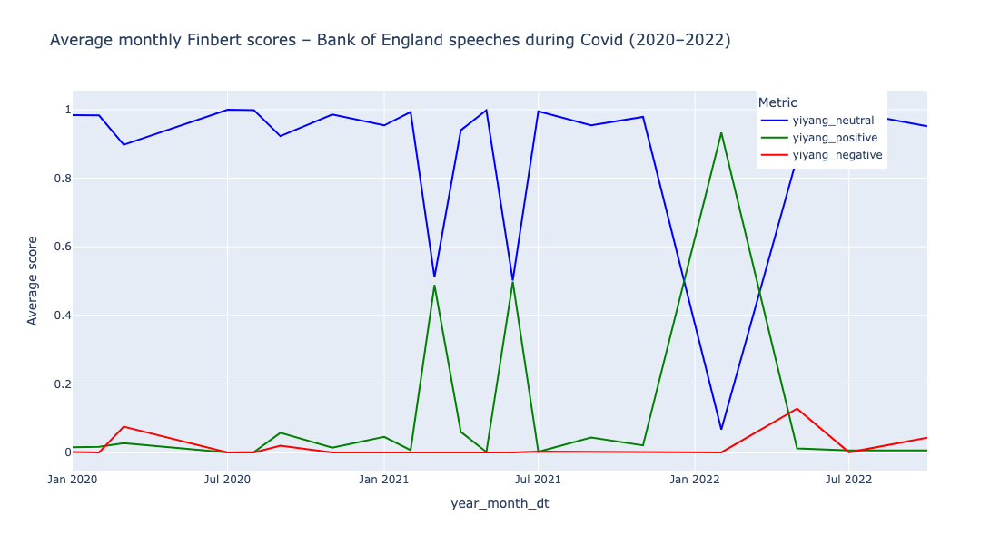

In [496]:
fig = px.line(
     finbert_gov_covid,
     x='year_month_dt',
     y=['yiyang_neutral','yiyang_positive', 'yiyang_negative'],
     title='Average monthly Finbert scores – Bank of England speeches during Covid (2020–2022)',
     labels={'value': 'Average score', 'variable': 'Metric'},
    color_discrete_sequence=['blue', 'green', 'red']
)

# Adjust size
fig.update_layout(width=1100, height=600)

# Move the legend
fig.update_layout(
    legend=dict(
        x=0.8,
        y=1,
        xanchor='left',
        yanchor='top'
    )
)

# Show the figure
fig.show()

### 4.2. Brexit vote

In [499]:
# Filter the data by date for before and after Brexit
start_date = '2016-01'
end_date = '2017-06'

In [501]:
# Filter the data for specified period
finbert_brexit = finbert_monthly[(finbert_monthly['year_month_dt'] >= start_date) & (finbert_monthly['year_month_dt'] <= end_date)]

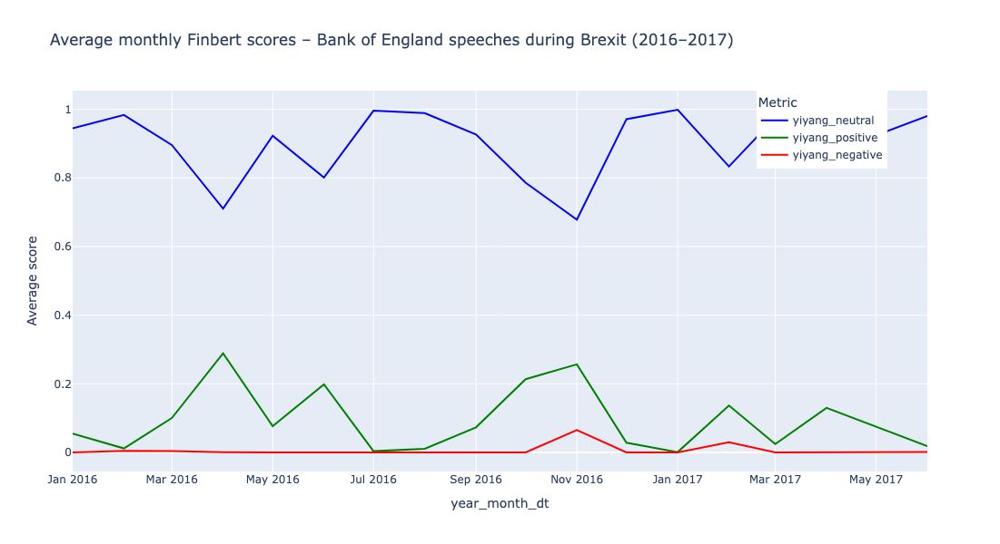

In [503]:
fig = px.line(
     finbert_brexit,
     x='year_month_dt',
     y=['yiyang_neutral','yiyang_positive', 'yiyang_negative'],
     title='Average monthly Finbert scores – Bank of England speeches during Brexit (2016–2017)',
     labels={'value': 'Average score', 'variable': 'Metric'},
    color_discrete_sequence=['blue', 'green', 'red']
)

# Adjust size
fig.update_layout(width=1100, height=600)

# Move the legend
fig.update_layout(
    legend=dict(
        x=0.8,
        y=1,
        xanchor='left',
        yanchor='top'
    )
)

# Show the figure
fig.show()

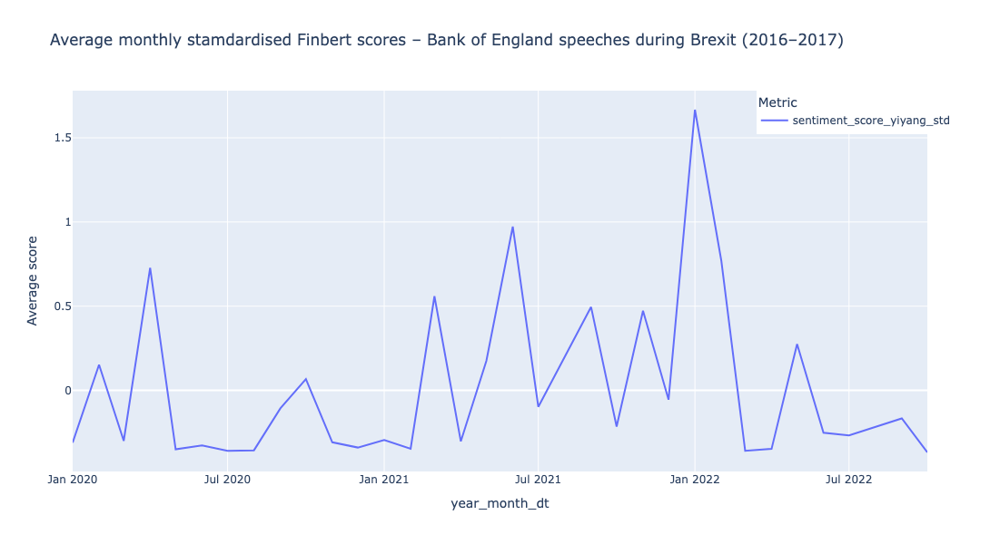

In [505]:
fig = px.line(
     finbert_covid,
     x='year_month_dt',
     y=['sentiment_score_yiyang_std'],
     title='Average monthly stamdardised Finbert scores – Bank of England speeches during Brexit (2016–2017)',
     labels={'value': 'Average score', 'variable': 'Metric'}
)

# Adjust size
fig.update_layout(width=1100, height=600)

# Move the legend
fig.update_layout(
    legend=dict(
        x=0.8,
        y=1,
        xanchor='left',
        yanchor='top'
    )
)

# Show the figure
fig.show()

### Filter the dataframe

In [ ]:
target_words = {
    'inflation': ['inflation'],           
    'monetary policy': ['monetary policy'],               
    'price stability': ['price stability'],
    'exchange rate': ['exchange rate'],
    'growth': ['growth'],
    'financial market': ['finanical market']
}

In [ ]:
def count_word(text, word):
    tokens = [w.lower() for w in word_tokenize(str(text))]
    return tokens.count(word.lower())

# Assuming your DataFrame is 'df' and text column is 'speech_text'

for category, words in target_words.items():
    # Since each category only has one word, no need to iterate over list, just take the first
    word = words[0]
    # Count occurrences of the word in each speech
    boe_speeches_sentiment[category + '_count'] = boe_speeches_sentiment['text_lemmatised'].apply(lambda x: count_word(x, word))

# Now, create separate dataframes per category
inflation_df = boe_speeches_sentiment[['text_lemmatised', 'inflation_count']].copy()
monetary_policy_df = boe_speeches_sentiment[['text_lemmatised', 'monetary policy_count']].copy()
price_stability_df = boe_speeches_sentiment[['text_lemmatised', 'price stability_count']].copy()
exchange_rate_df = boe_speeches_sentiment[['text_lemmatised', 'exchange rate_count']].copy()
growth_df = boe_speeches_sentiment[['text_lemmatised', 'growth_count']].copy()
financial_market_df = boe_speeches_sentiment[['text_lemmatised', 'financial market_count']].copy()

# (Optional) filter for speeches where the target word appears at least once
inflation_df = inflation_df[inflation_df['inflation_count'] > 3]
monetary_policy_df = monetary_policy_df[monetary_policy_df['monetary policy_count'] > 3]
price_stability_df = price_stability_df[price_stability_df['price stability_count'] > 3]
exchange_rate_df = exchange_rate_df[exchange_rate_df['exchange rate_count'] > 3]
growth_df = growth_df[growth_df['growth_count'] > 3]
financial_market_df = financial_market_df[financial_market_df['financial market_count'] > 3]

In [ ]:
def count_word(text, word):
    tokens = [w.lower() for w in word_tokenize(str(text))]
    return tokens.count(word.lower())

# Assuming your DataFrame is 'df' and text column is 'speech_text'

for category, words in target_words.items():
    # Since each category only has one word, no need to iterate over list, just take the first
    word = words[0]
    # Count occurrences of the word in each speech
    boe_speeches_sentiment[category + '_count'] = boe_speeches_sentiment['text'].apply(lambda x: count_word(x, word))

# Now, create separate dataframes per category
inflation_df = boe_speeches_sentiment[['text', 'inflation_count']].copy()
monetary_policy_df = boe_speeches_sentiment[['text', 'monetary policy_count']].copy()
price_stability_df = boe_speeches_sentiment[['text', 'price stability_count']].copy()
exchange_rate_df = boe_speeches_sentiment[['text', 'exchange rate_count']].copy()
growth_df = boe_speeches_sentiment[['text', 'growth_count']].copy()
financial_market_df = boe_speeches_sentiment[['text', 'financial market_count']].copy()

# (Optional) filter for speeches where the target word appears at least once
inflation_df = inflation_df[inflation_df['inflation_count'] > 3]
monetary_policy_df = monetary_policy_df[monetary_policy_df['monetary policy_count'] > 3]
price_stability_df = price_stability_df[price_stability_df['price stability_count'] > 3]
exchange_rate_df = exchange_rate_df[exchange_rate_df['exchange rate_count'] > 3]
growth_df = growth_df[growth_df['growth_count'] > 3]
financial_market_df = financial_market_df[financial_market_df['financial market_count'] > 3]

In [ ]:
inflation_df.head()

In [ ]:
monetary_policy_df.head()

In [ ]:
price_stability_df.head()

In [ ]:
exchange_rate_df.head()

In [ ]:
growth_df.head()

In [ ]:
financial_market_df.head()

In [ ]:
def count_target_words(text, target_words):
    tokens = [w.lower() for w in word_tokenize(str(text))]
    count = sum(tokens.count(word) for word in target_words)
    return count

# Apply and add as a new column
target_words = ['inflation', 'monetary policy', 'price stability', 'exchange rate', 'growth', 'financial market']
boe_speeches_sentiment['target_word_freq'] = boe_speeches_sentiment['text_lemmatised_str'].apply(lambda x: count_target_words(x, target_words))

# View the dataFrame
boe_speeches_sentiment.head()

In [ ]:
# For example, speeches where 'inflation' appears more than 3 times
inflation_df = boe_speeches_sentiment[boe_speeches_sentiment['target_word_freq'] > 5]

inflation_df.head()

## 4. Exploratory Analysis for Correlation with Economic Indicators

### 4.1. Prepare the data

In [554]:
# List of DataFrames to merge
dataframes_to_merge = [uk_economic_indicators]

# Use reduce to merge all DataFrames in the list
boe_speeches_indicators = reduce(lambda left, right: left.merge(right, on='year_month', how='left'), dataframes_to_merge, boe_speeches_new)

# View the merged DataFrame
boe_speeches_indicators.head()

,reference,country,date,title,author,is_gov,text,date_format,year_month,year_x,...,uk_interest_rate,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
0,r980915a_BOE,united kingdom,1998-09-15,Speech,george,1,"Thank you, Chairman. I'm actually very pleased...",1998-09-15,1998-09,1998,...,7.50,-4.9,1.682209,4657.921320,5.00,4.80,4.77,15.3,26.7,67057
1,r981021b_BOE,united kingdom,1998-10-21,Britain in Europe,george,1,It's a great pleasure to be here in the beauti...,1998-10-21,1998-10,1998,...,7.25,-6.7,1.695200,4516.211359,4.98,4.96,5.00,15.6,25.8,66757
2,r981021a_BOE,united kingdom,1998-10-21,Impact of the recent turbulence in internation...,king,1,Few industries have suffered more from volatil...,1998-10-21,1998-10,1998,...,7.25,-6.7,1.695200,4516.211359,4.98,4.96,5.00,15.6,25.8,66757
3,r981101a_BOE,united kingdom,1998-11-01,"Economic policy, with and without forecasts",budd,0,My topic this evening is the use of forecasts ...,1998-11-01,1998-11,1998,...,6.75,-3.5,1.661986,4885.032366,4.71,4.59,4.60,14.9,26.9,66757
4,r981101b_BOE,united kingdom,1998-11-01,Inflation targeting in practice: the UK experi...,vickers,0,"Six years ago this week, sterling left the exc...",1998-11-01,1998-11,1998,...,6.75,-3.5,1.661986,4885.032366,4.71,4.59,4.60,14.9,26.9,66757


In [556]:
# Check for missing values.
boe_speeches_indicators.isnull().sum()

reference                       0
country                         0
date                            0
title                           0
author                          0
is_gov                          0
text                            0
date_format                     0
year_month                      0
year_x                          0
year_month_dt                   0
text_cleaned                    0
text_tokenised                  0
text_lemmatised                 0
text_lemmatised_str             0
word_count                      0
Negative                        0
Positive                        0
Uncertainty                     0
Litigious                       0
Strong                          0
Weak                            0
Constraining                    0
sentiment_score_lexicon         0
sentiment_score_lexicon_std     0
lexicon_label                   0
lexicon_label_percentile        0
negative_custom                 0
positive_custom                 0
uncertainty_cu

In [558]:
# Explore the DataFrame.
boe_speeches_indicators.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1209 entries, 0 to 1208
Data columns (total 58 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   reference                     1209 non-null   object        
 1   country                       1209 non-null   object        
 2   date                          1209 non-null   datetime64[ns]
 3   title                         1209 non-null   object        
 4   author                        1209 non-null   object        
 5   is_gov                        1209 non-null   int64         
 6   text                          1209 non-null   object        
 7   date_format                   1209 non-null   datetime64[ns]
 8   year_month                    1209 non-null   period[M]     
 9   year_x                        1209 non-null   int32         
 10  year_month_dt                 1209 non-null   datetime64[ns]
 11  text_cleaned                  

### 4.2. Plot the data

In [560]:
# Display all column names.
boe_speeches_indicators.columns

Index(['reference', 'country', 'date', 'title', 'author', 'is_gov', 'text',
       'date_format', 'year_month', 'year_x', 'year_month_dt', 'text_cleaned',
       'text_tokenised', 'text_lemmatised', 'text_lemmatised_str',
       'word_count', 'Negative', 'Positive', 'Uncertainty', 'Litigious',
       'Strong', 'Weak', 'Constraining', 'sentiment_score_lexicon',
       'sentiment_score_lexicon_std', 'lexicon_label',
       'lexicon_label_percentile', 'negative_custom', 'positive_custom',
       'uncertainty_custom', 'sentiment_score_custom',
       'sentiment_score_custom_std', 'custom_label', 'custom_label_percentile',
       'yiyang_probs', 'yiyang_neutral', 'yiyang_positive', 'yiyang_negative',
       'yiyang_label', 'yiyang_confidence', 'sentiment_score_yiyang',
       'sentiment_score_yiyang_std', 'Gpt_sentiment', 'year_y', 'month',
       'uk_inflation_rate_CPIH', 'uk_unemployment_rate', 'uk_gdp_growth',
       'uk_interest_rate', 'uk_consumer_confidence', 'gbp_usd_fx', 'ftse_250',

In [562]:
boe_speeches_indicators['year_month'].dtypes

period[M]

In [568]:
# Convert 'year_month' Period to datetime
# boe_speeches_indicators['date'] = boe_speeches_indicators['year_month'].dt.to_timestamp()

In [570]:
# boe_speeches_indicators['year_month'].dtypes

**Confidence Index**

In [ ]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot VADER text_compound on primary y-axis.
ax1.plot(boe_speeches_indicators['date'], boe_speeches_indicators['text_compound'], color='blue', label='VADER compound score')
ax1.set_xlabel('Date')
ax1.set_ylabel('VADER compound score', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot  on secondary y-axis
ax2.plot(boe_speeches_indicators['date'], boe_speeches_indicators['confidence_index'], color='red', label='Confidence Index')
ax2.set_ylabel('Confidence Index', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Add title and legend
plt.title('Bank of England VADER Sentiment Score vs UK Confidence Index')
fig.legend(loc='upper left', bbox_to_anchor=(0.1, 0.9))

# Display the chart
plt.tight_layout()
plt.show()

In [ ]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot VADER text_compound on primary y-axis.
ax1.plot(boe_speeches_indicators['date'], boe_speeches_indicators['sentiment_score_lm_weighted'], color='blue', label='sentiment_score_lm_weighted')
ax1.set_xlabel('Date')
ax1.set_ylabel('sentiment_score_lm_weighted', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot  on secondary y-axis
ax2.plot(boe_speeches_indicators['date'], boe_speeches_indicators['confidence_index'], color='red', label='Confidence Index')
ax2.set_ylabel('Confidence Index', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Add title and legend
plt.title('Bank of England Loughran-McDonald Weighted Sentiment Score vs UK Confidence Index')
fig.legend(loc='upper left', bbox_to_anchor=(0.1, 0.9))

# Display the chart
plt.tight_layout()
plt.show()

In [ ]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot VADER text_compound on primary y-axis.
ax1.plot(boe_speeches_indicators['date'], boe_speeches_indicators[['text_pos', 'text_neg', 'text_neu']], color='blue', label='VADER compound score')
ax1.set_xlabel('Date')
ax1.set_ylabel('VADER Scores', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot  on secondary y-axis
ax2.plot(boe_speeches_indicators['date'], boe_speeches_indicators['confidence_index'], color='red', label='Confidence Index')
ax2.set_ylabel('Confidence Index', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Add title and legend
plt.title('Bank of England VADER Sentiment Score vs UK Confidence Index')
fig.legend(loc='upper left', bbox_to_anchor=(0.1, 0.9))

# Display the chart
plt.tight_layout()
plt.show()

In [ ]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot VADER text_compound on primary y-axis.
ax1.plot(boe_speeches_indicators['date'], boe_speeches_indicators[['Positive', 'Negative', 'Uncertainty']], color='blue', label='Lexicom Sentiment')
ax1.set_xlabel('Date')
ax1.set_ylabel('Lexicon Sentiment', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot  on secondary y-axis
ax2.plot(boe_speeches_indicators['date'], boe_speeches_indicators['confidence_index'], color='red', label='Confidence Index')
ax2.set_ylabel('Confidence Index', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Add title and legend
plt.title('Bank of England VADER Sentiment Score vs UK Confidence Index')
fig.legend(loc='upper left', bbox_to_anchor=(0.1, 0.9))

# Display the chart
plt.tight_layout()
plt.show()

**Inflation**

In [ ]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot VADER text_compound on primary y-axis.
ax1.plot(boe_speeches_indicators['date'], boe_speeches_indicators[['negative_lm', 'positive_lm', 'uncertainty_lm']], color='blue', label='weighted_sentiment_LM')
ax1.set_xlabel('Date')
ax1.set_ylabel('weighted_sentiment_LM', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot  on secondary y-axis
ax2.plot(boe_speeches_indicators['date'], boe_speeches_indicators['Inflation Rate'], color='red', label='Inflation Rate')
ax2.set_ylabel('Inflation Rate', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Add title and legend
plt.title('Bank of England Loughran-McDonald Weighted Sentiment Score vs UK Inflation Rate')
fig.legend(loc='upper left', bbox_to_anchor=(0.1, 0.9))

# Display the chart
plt.tight_layout()
plt.show()

In [ ]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot VADER text_compound on primary y-axis.
ax1.plot(boe_speeches_indicators['date'], boe_speeches_indicators['sentiment_score_lm_weighted'], color='blue', label='sentiment_score_lm_weighted')
ax1.set_xlabel('Date')
ax1.set_ylabel('weighted_sentiment_LM', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot  on secondary y-axis
ax2.plot(boe_speeches_indicators['date'], boe_speeches_indicators['Unemployment rate'], color='red', label='Unemployment Rate')
ax2.set_ylabel('Unemployment Rate', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Add title and legend
plt.title('Bank of England Loughran-McDonald Weighted Sentiment Score vs UK Unemployment Rate')
fig.legend(loc='upper left', bbox_to_anchor=(0.1, 0.9))

# Display the chart
plt.tight_layout()
plt.show()

**Interest Rates**

In [ ]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot VADER text_compound on primary y-axis.
ax1.plot(boe_speeches_indicators['date'], boe_speeches_indicators['sentiment_score_lm_weighted'], color='blue', label='sentiment_score_lm_weighted')
ax1.set_xlabel('Date')
ax1.set_ylabel('weighted_sentiment_LM', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot  on secondary y-axis
ax2.plot(boe_speeches_indicators['date'], boe_speeches_indicators['Bank Rate'], color='red', label='Bank Rate')
ax2.set_ylabel('Bank Rate', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Add title and legend
plt.title('Bank of England Loughran-McDonald Weighted Sentiment Score vs UK Bank Rate')
fig.legend(loc='upper left', bbox_to_anchor=(0.1, 0.9))

# Display the chart
plt.tight_layout()
plt.show()

In [ ]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot VADER text_compound on primary y-axis.
ax1.plot(boe_speeches_indicators['date'], boe_speeches_indicators['sentiment_score_lm_weighted'], color='blue', label='sentiment_score_lm_weighted')
ax1.set_xlabel('Date')
ax1.set_ylabel('weighted_sentiment_LM', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot  on secondary y-axis
ax2.plot(boe_speeches_indicators['date'], boe_speeches_indicators['Bank Rate'], color='red', label='Bank Rate')
ax2.set_ylabel('Bank Rate', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Add title and legend
plt.title('Bank of England Loughran-McDonald Weighted Sentiment Score vs UK Bank Rate')
fig.legend(loc='upper left', bbox_to_anchor=(0.1, 0.9))

# Display the chart
plt.tight_layout()
plt.show()

In [ ]:
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(20, 6))

# Plot VADER text_compound on primary y-axis.
ax1.plot(boe_speeches_indicators['date'], boe_speeches_indicators[['text_pos', 'text_neg', 'text_neu']], color='blue', label='VADER compound score')
ax1.set_xlabel('Date')
ax1.set_ylabel('VADER Scores', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot  on secondary y-axis
ax2.plot(boe_speeches_indicators['date'], boe_speeches_indicators['Bank Rate'], color='red', label='Bank Rate')
ax2.set_ylabel('Bank Rate', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Add title and legend
plt.title('Bank of England VADER Sentiment Score vs UK Bank Rate')
fig.legend(loc='upper left', bbox_to_anchor=(0.1, 0.9))

# Display the chart
plt.tight_layout()
plt.show()

### 4.3. Initial statistical analysis

In [572]:
boe_speeches_indicators.columns

Index(['reference', 'country', 'date', 'title', 'author', 'is_gov', 'text',
       'date_format', 'year_month', 'year_x', 'year_month_dt', 'text_cleaned',
       'text_tokenised', 'text_lemmatised', 'text_lemmatised_str',
       'word_count', 'Negative', 'Positive', 'Uncertainty', 'Litigious',
       'Strong', 'Weak', 'Constraining', 'sentiment_score_lexicon',
       'sentiment_score_lexicon_std', 'lexicon_label',
       'lexicon_label_percentile', 'negative_custom', 'positive_custom',
       'uncertainty_custom', 'sentiment_score_custom',
       'sentiment_score_custom_std', 'custom_label', 'custom_label_percentile',
       'yiyang_probs', 'yiyang_neutral', 'yiyang_positive', 'yiyang_negative',
       'yiyang_label', 'yiyang_confidence', 'sentiment_score_yiyang',
       'sentiment_score_yiyang_std', 'Gpt_sentiment', 'year_y', 'month',
       'uk_inflation_rate_CPIH', 'uk_unemployment_rate', 'uk_gdp_growth',
       'uk_interest_rate', 'uk_consumer_confidence', 'gbp_usd_fx', 'ftse_250',

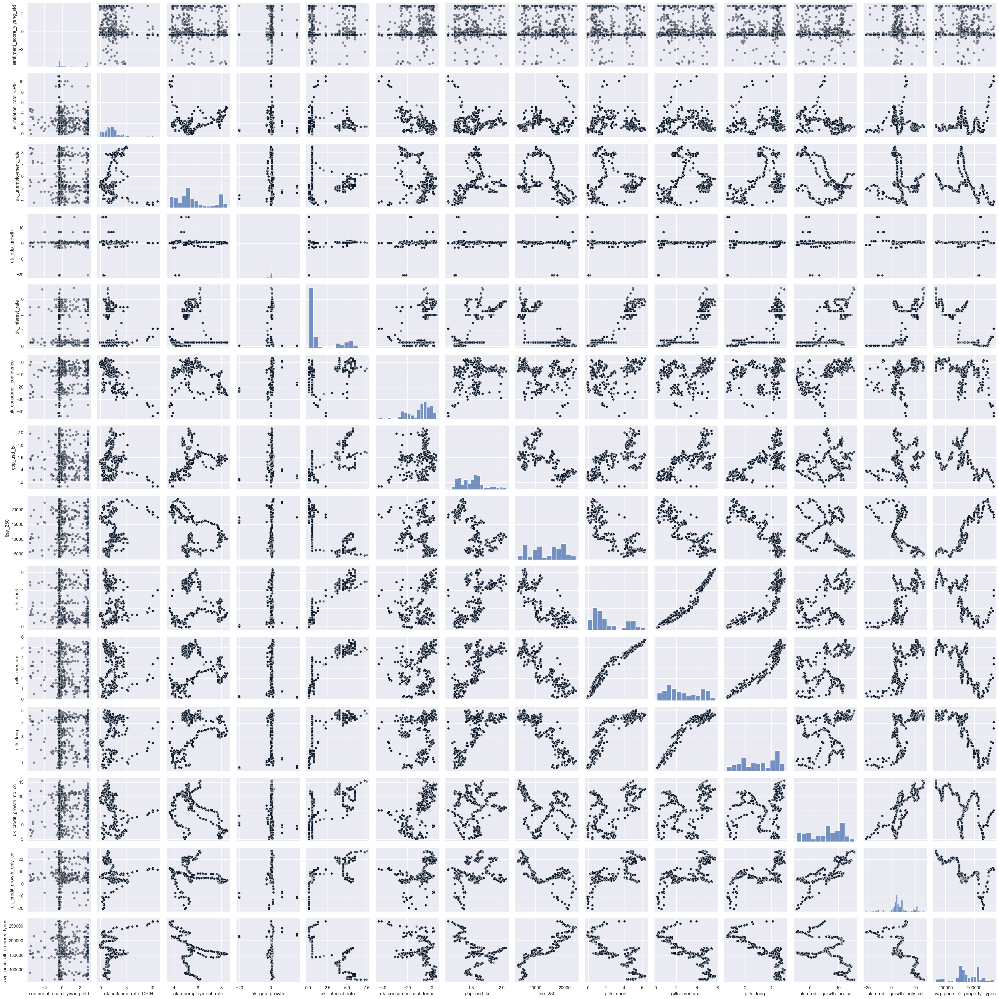

In [574]:
# Create a pairplot for sentiment score, unemployment, inflation and exchange rates.
columns_sentiment_finbert = ['sentiment_score_yiyang_std', 'uk_inflation_rate_CPIH', 'uk_unemployment_rate', 'uk_gdp_growth',
                             'uk_interest_rate', 'uk_consumer_confidence', 'gbp_usd_fx', 'ftse_250', 'gilts_short ', 
                             'gilts_medium ', 'gilts_long ', 'uk_credit_growth_no_cc', 'uk_credit_growth_only_cc',
                             'avg_price_all_property_types']

# Create a pairplot using only the specified columns
sns.pairplot(boe_speeches_indicators[columns_sentiment_finbert], plot_kws={'alpha': 0.5, 'color': '#0e1b2c'})

# Save figure.
plt.savefig('Fig_Pairplot_Indicators.png', dpi=500)

# Display the plot.
plt.tight_layout()
plt.show()

In [580]:
# Create the correlation matrix for the sentiment score with the indicators only.
correlation_matrix_finbert = boe_speeches_indicators[columns_sentiment_finbert].corr()

# Display the correlation matrix
correlation_matrix_finbert

,sentiment_score_yiyang_std,uk_inflation_rate_CPIH,uk_unemployment_rate,uk_gdp_growth,uk_interest_rate,uk_consumer_confidence,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long,uk_credit_growth_no_cc,uk_credit_growth_only_cc,avg_price_all_property_types
sentiment_score_yiyang_std,1.000000,-0.023325,-0.005535,-0.006820,0.077645,0.046552,0.068755,-0.029081,0.071937,0.065544,0.050958,0.007577,0.019652,-0.034993
uk_inflation_rate_CPIH,-0.023325,1.000000,0.067503,-0.055251,-0.074571,-0.752007,-0.118604,0.086332,0.003654,0.054603,0.090170,-0.352793,0.019796,0.313656
uk_unemployment_rate,-0.005535,0.067503,1.000000,-0.022755,-0.122347,-0.327020,0.433858,-0.476198,0.062297,0.271013,0.501942,-0.587476,-0.156832,-0.455154
uk_gdp_growth,-0.006820,-0.055251,-0.022755,1.000000,-0.035349,0.134017,-0.026512,0.099590,-0.058369,-0.075428,-0.094449,-0.057659,-0.105851,0.070426
uk_interest_rate,0.077645,-0.074571,-0.122347,-0.035349,1.000000,0.275771,0.558205,-0.708596,0.930946,0.842631,0.682992,0.446715,0.637922,-0.669022
uk_consumer_confidence,0.046552,-0.752007,-0.327020,0.134017,0.275771,1.000000,0.120345,-0.041700,0.229375,0.142919,0.027495,0.624090,0.306993,-0.304745
gbp_usd_fx,0.068755,-0.118604,0.433858,-0.026512,0.558205,0.120345,1.000000,-0.619923,0.625451,0.694390,0.720624,-0.035404,0.167091,-0.526755
ftse_250,-0.029081,0.086332,-0.476198,0.099590,-0.708596,-0.041700,-0.619923,1.000000,-0.806288,-0.875311,-0.902327,-0.094204,-0.565059,0.902586
gilts_short,0.071937,0.003654,0.062297,-0.058369,0.930946,0.229375,0.625451,-0.806288,1.000000,0.967729,0.853808,0.335435,0.660689,-0.741588
gilts_medium,0.065544,0.054603,0.271013,-0.075428,0.842631,0.142919,0.694390,-0.875311,0.967729,1.000000,0.953270,0.209828,0.633339,-0.792445


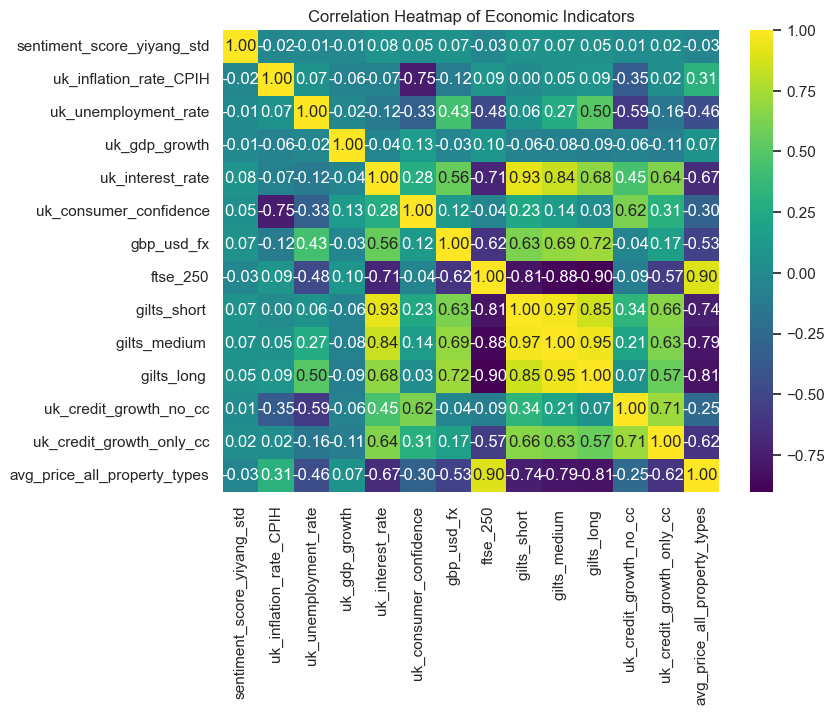

In [582]:
# Create a heatmap of the correlation matrix
plt.figure(figsize=(8, 6)) 
sns.heatmap(correlation_matrix_finbert, annot=True, fmt=".2f", cmap='viridis', cbar=True)

# Customize title and labels
plt.title('Correlation Heatmap of Economic Indicators')
plt.show()

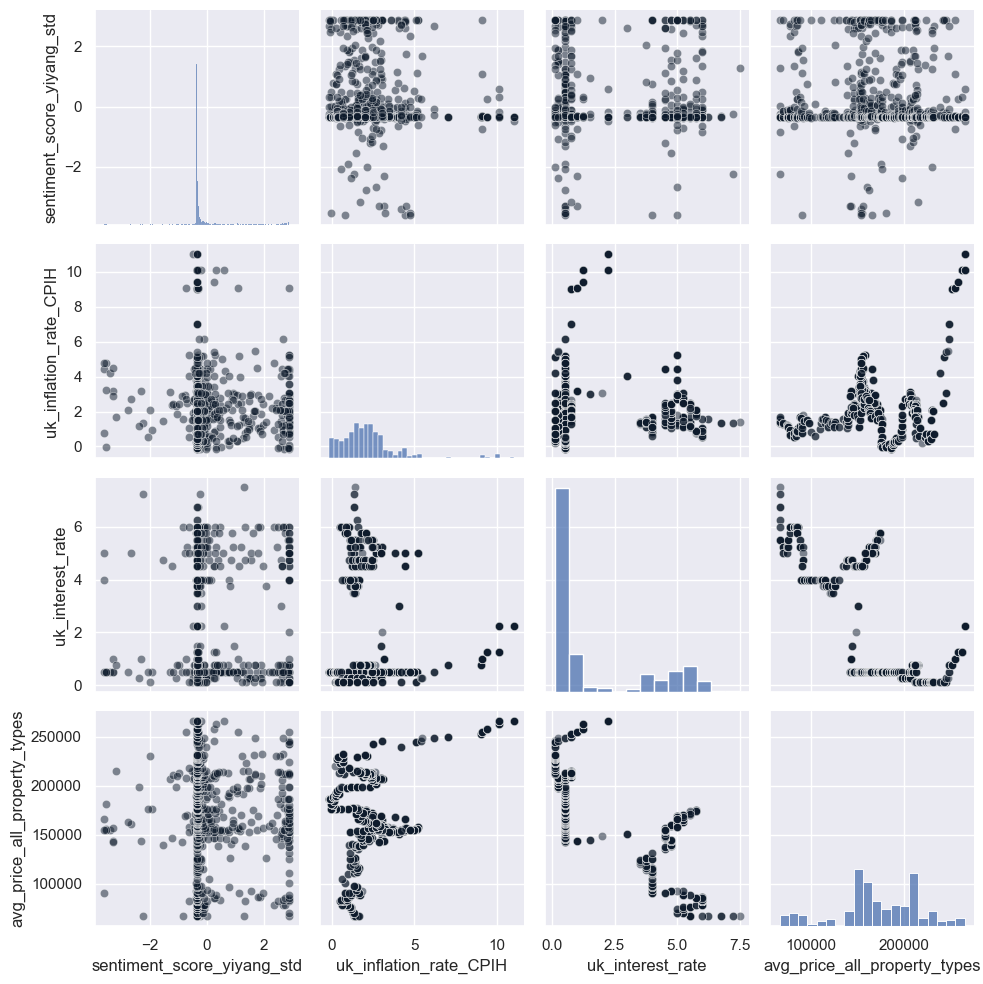

In [592]:
# Create a pairplot for sentiment score, unemployment, inflation and exchange rates.
columns_sentiment_finbert_inflation = ['sentiment_score_yiyang_std', 'uk_inflation_rate_CPIH', 'uk_interest_rate',
                             'avg_price_all_property_types']

# Create a pairplot using only the specified columns
sns.pairplot(boe_speeches_indicators[columns_sentiment_finbert_inflation], plot_kws={'alpha': 0.5, 'color': '#0e1b2c'})

# Save figure.
# plt.savefig('Fig_Pairplot_Indicators.png', dpi=500)

# Display the plot.
plt.tight_layout()
plt.show()

In [594]:
# Create the correlation matrix for the sentiment score with the indicators only.
correlation_matrix_finbert_inflation = boe_speeches_indicators[columns_sentiment_finbert_inflation].corr()

# Display the correlation matrix
correlation_matrix_finbert_inflation

,sentiment_score_yiyang_std,uk_inflation_rate_CPIH,uk_interest_rate,avg_price_all_property_types
sentiment_score_yiyang_std,1.000000,-0.023325,0.077645,-0.034993
uk_inflation_rate_CPIH,-0.023325,1.000000,-0.074571,0.313656
uk_interest_rate,0.077645,-0.074571,1.000000,-0.669022
avg_price_all_property_types,-0.034993,0.313656,-0.669022,1.000000


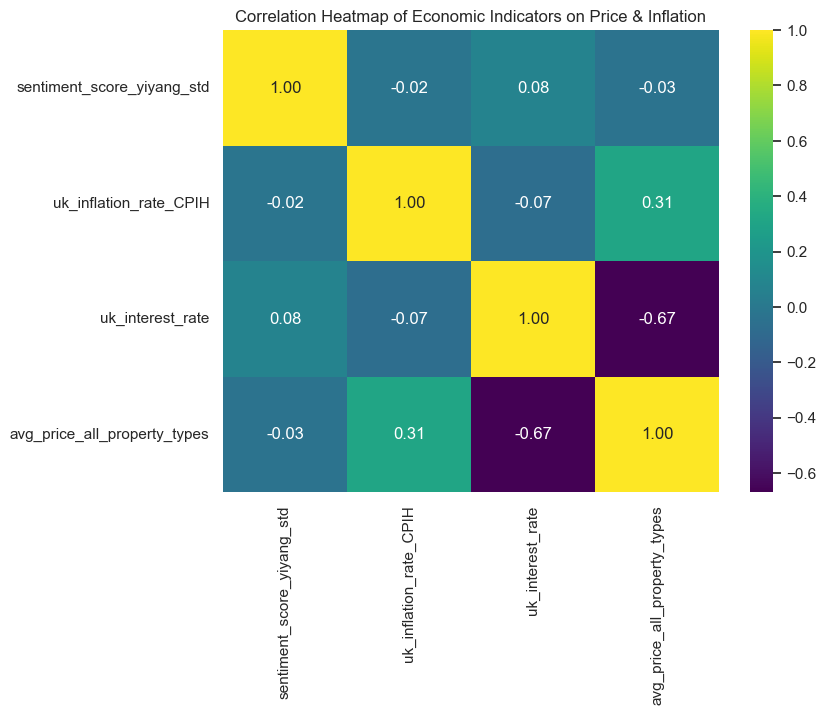

In [596]:
# Create a heatmap of the correlation matrix
plt.figure(figsize=(8, 6)) 
sns.heatmap(correlation_matrix_finbert_inflation, annot=True, fmt=".2f", cmap='viridis', cbar=True)

# Customize title and labels
plt.title('Correlation Heatmap of Economic Indicators on Price & Inflation')
plt.show()

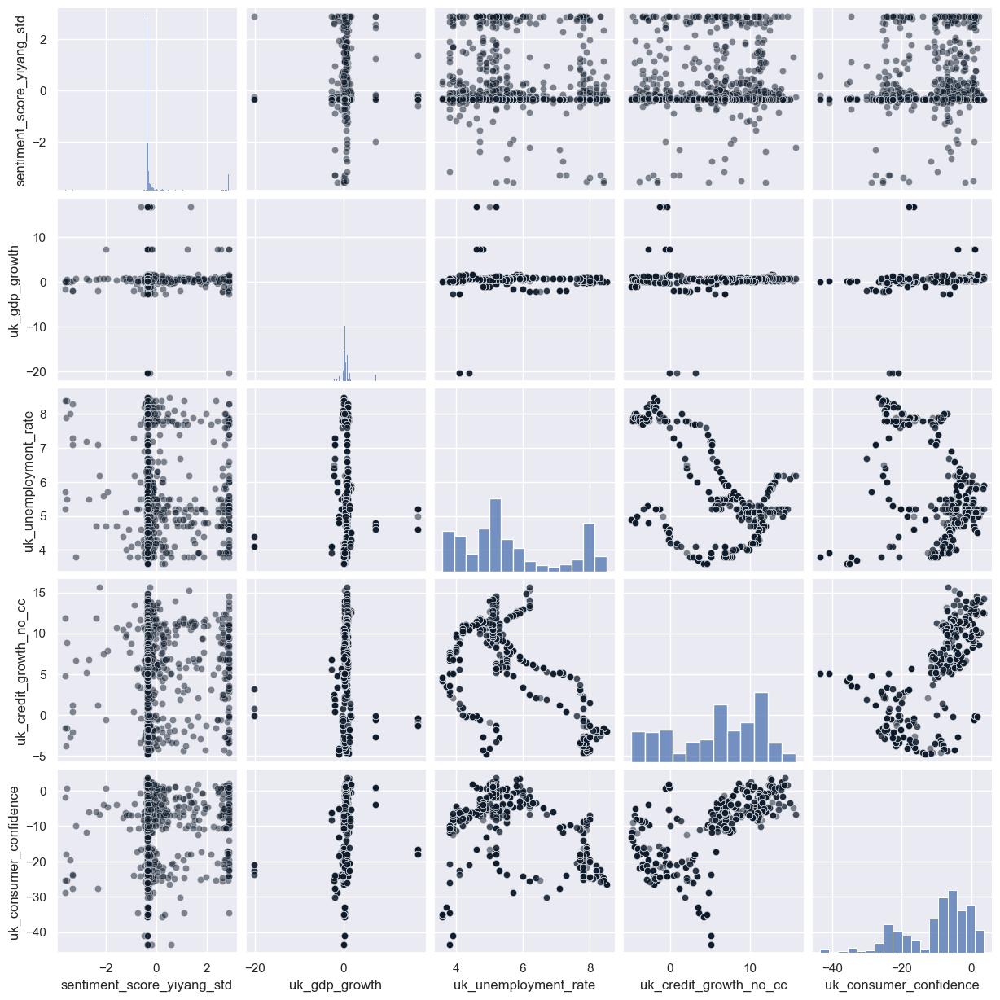

In [614]:
# Create a pairplot for sentiment score, unemployment, inflation and exchange rates.
columns_sentiment_finbert_macro = ['sentiment_score_yiyang_std', 'uk_gdp_growth', 'uk_unemployment_rate', 
                            'uk_credit_growth_no_cc', 'uk_consumer_confidence']

# Create a pairplot using only the specified columns
sns.pairplot(boe_speeches_indicators[columns_sentiment_finbert_macro], plot_kws={'alpha': 0.5, 'color': '#0e1b2c'})

# Save figure.
# plt.savefig('Fig_Pairplot_Indicators.png', dpi=500)

# Display the plot.
plt.tight_layout
plt.show()

In [605]:
# Create the correlation matrix for the sentiment score with the indicators only.
correlation_matrix_finbert_macro = boe_speeches_indicators[columns_sentiment_finbert_macro].corr()

# Display the correlation matrix
correlation_matrix_finbert_macro

,sentiment_score_yiyang_std,uk_gdp_growth,uk_unemployment_rate,uk_credit_growth_no_cc,uk_consumer_confidence
sentiment_score_yiyang_std,1.000000,-0.006820,-0.005535,0.007577,0.046552
uk_gdp_growth,-0.006820,1.000000,-0.022755,-0.057659,0.134017
uk_unemployment_rate,-0.005535,-0.022755,1.000000,-0.587476,-0.327020
uk_credit_growth_no_cc,0.007577,-0.057659,-0.587476,1.000000,0.624090
uk_consumer_confidence,0.046552,0.134017,-0.327020,0.624090,1.000000


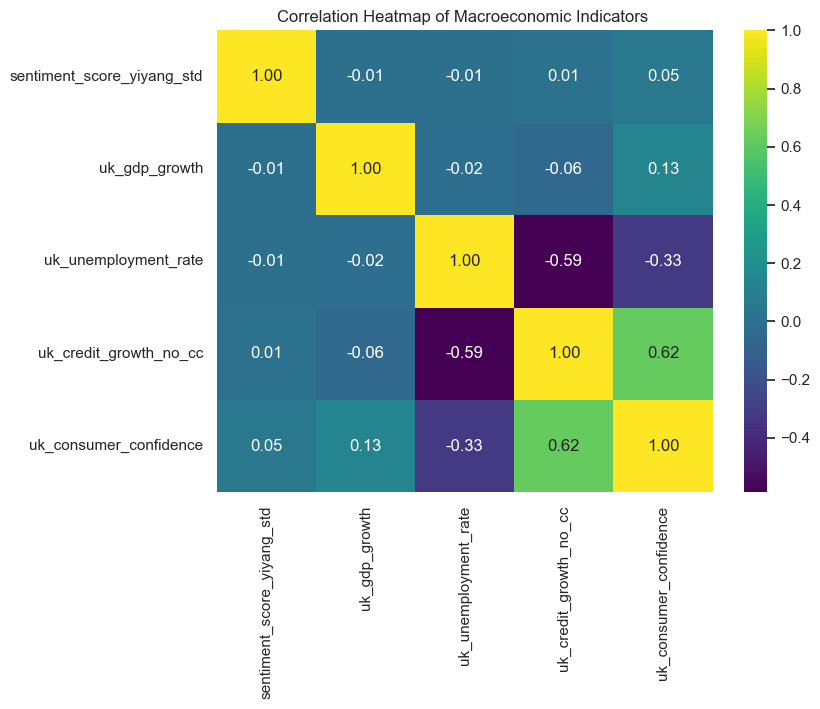

In [610]:
# Create a heatmap of the correlation matrix
plt.figure(figsize=(8, 6)) 
sns.heatmap(correlation_matrix_finbert_macro, annot=True, fmt=".2f", cmap='viridis', cbar=True)

# Customize title and labels
plt.title('Correlation Heatmap of Macroeconomic Indicators ')
plt.show()

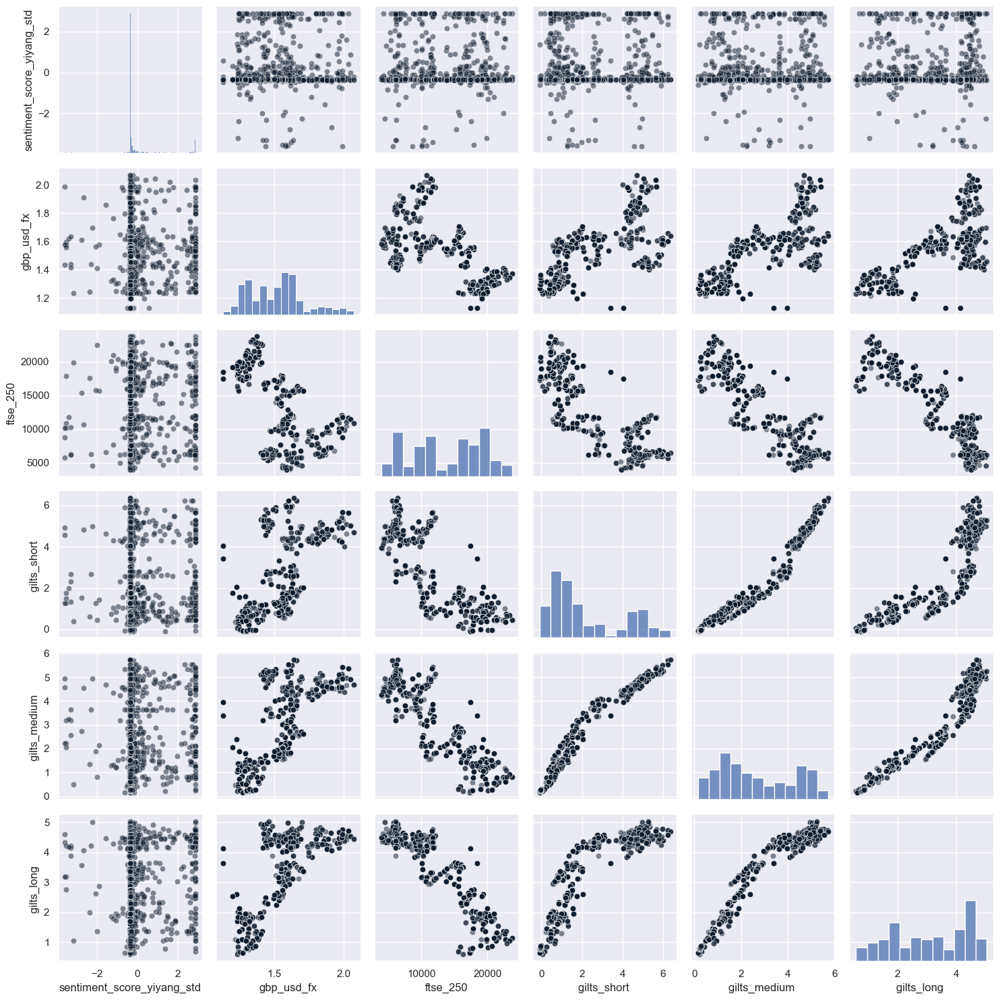

In [612]:
# Create a pairplot for sentiment score, unemployment, inflation and exchange rates.
columns_sentiment_finbert_finance = ['sentiment_score_yiyang_std', 'gbp_usd_fx', 'ftse_250', 'gilts_short ', 
                             'gilts_medium ', 'gilts_long ']

# Create a pairplot using only the specified columns
sns.pairplot(boe_speeches_indicators[columns_sentiment_finbert_finance], plot_kws={'alpha': 0.5, 'color': '#0e1b2c'})

# Save figure.
# plt.savefig('Fig_Pairplot_Indicators.png', dpi=500)

# Display the plot.
plt.tight_layout()
plt.show()

In [616]:
# Create the correlation matrix for the sentiment score with the indicators only.
correlation_matrix_finbert_finance = boe_speeches_indicators[columns_sentiment_finbert_finance].corr()

# Display the correlation matrix
correlation_matrix_finbert_finance

,sentiment_score_yiyang_std,gbp_usd_fx,ftse_250,gilts_short,gilts_medium,gilts_long
sentiment_score_yiyang_std,1.000000,0.068755,-0.029081,0.071937,0.065544,0.050958
gbp_usd_fx,0.068755,1.000000,-0.619923,0.625451,0.694390,0.720624
ftse_250,-0.029081,-0.619923,1.000000,-0.806288,-0.875311,-0.902327
gilts_short,0.071937,0.625451,-0.806288,1.000000,0.967729,0.853808
gilts_medium,0.065544,0.694390,-0.875311,0.967729,1.000000,0.953270
gilts_long,0.050958,0.720624,-0.902327,0.853808,0.953270,1.000000
